## Initial configuration

In [1]:
###################MEMORY###################
import os
import gc
import urllib.request
import zipfile
import json
import gdown

###################DATASET###################
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable

###################IMAGE###################
import cv2
from PIL import Image

###################PLOTTING###################
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn

###################PYTORCH MODEL###################
import torch
import torch.nn as nn
import torch.optim as optim
from torchsummary import summary

###################DATA STRUCTURES###################
import numpy as np
from collections import Counter

###################EXTRA###################
from tqdm import tqdm,trange

In [2]:
#Usefull for better outputs visualization
PURPLE = "\033[95m"
CYAN = "\033[96m"
DARKCYAN = "\033[36m"
BLUE = "\033[94m"
GREEN = "\033[92m"
YELLOW = "\033[93m"
RED = "\033[91m"
BOLD = "\033[1m"
UNDERLINE = "\033[4m"
END = "\033[0m"

### Project settings

In [3]:
###################MEMORY SETTINGS###################
data_dir_unsplitted = "dataset/unsplitted" #location of the raw dataser
save_dir_splitted = "dataset/splitted" #location where to save the preprocessed dataset
data_dir = "dataset/splitted" #location where the preprocessed dataset is
models_dir ="models/" #the resuls will be saved here

os.makedirs(models_dir,exist_ok=True)


###################DATASETS SETTINGS###################
patch_size = 128 #dimension of each patch: i.e. a image patch_size x patch_size
n_samples_train = 40 #number of patches for each image the train dataset
n_samples_valtest = 40 #number of patches for each image in the validation/test set

grayscale= False #return grayscale image
fft = False #return the fft of the image

LOAD_DATASET = True #load a preprocessed dataset
DATASET_ALREADY_DOWNLOADED = True #the file zip containing the dataset is already downloaded?
DATASET_ALREADY_UNZIPPED = True #the file zip containing the dataset is already unzipped?

if(LOAD_DATASET):
    data_dir = "dataset/splitted" #location where the preprocessed dataset is


###################TRAINING SETTINGS###################
batch_size = 75
learning_rate= 0.001
num_epochs = 70

mse_weight = 50 #weight of the MSE loss during the training: i.e. LOSS = Cross Entropy + mse_weight x MSE

###################MODEL SETTINGS###################
LOAD_MODEL = True #the models load was trained with a value of mse_weight = 50 and for comparison with mse_weight = 0
MODEL_ALREADY_DOWNLOADED = True #the file zip containing the model is already downloaded?
MODEL_ALREADY_UNZIPPED = False #the file zip containing the model is already unzipped?

if(LOAD_MODEL):
    models_dir ="models/" #the resuls will be saved here



###################GENERAL SETTINGS###################
SAVE_FIG = False #do you want save the plots into a image file?
SEED = 42
np.random.seed(SEED) 

## Dataset preparation

### Dataset splitting and data augmentation

In [4]:
classes = ["CLL", "FL", "MCL"]
id_to_name = {0:"CLL",1:"FL",2:"MCL"}
name_to_id = {"CLL":0,"FL":1,"MCL":2}

if(not LOAD_DATASET):
    data = []
    labels = []
    
    #iterates over all the possible classes and load all the images
    for i, cl in enumerate(classes):
        path = os.path.join(data_dir_unsplitted, cl)
        images = os.listdir(path)
        for img in tqdm(images,desc=cl):
            img_path = os.path.join(path, img)
            img = cv2.imread(img_path).astype(np.uint8)
            
            data.append(img)
            labels.append(i) 
    

    data = np.array(data)
    labels = np.array(labels)

    #splitting
    train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size=0.2, random_state=SEED)
    train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=0.125,
                                                                      random_state=SEED)

    print("Train samples:", len(train_data))
    print("Test samples:", len(test_data))
    print("Validation samples:", len(val_data))

### Saving the splitted dataset

In [5]:
def crop_image(image, patch_size, n_samples = 40):
    h, w, _ = image.shape
    h_eff = h - patch_size
    w_eff = w - patch_size
    samples = []
    
    for i in range(n_samples):
        h_vertex = np.random.randint(h_eff)
        w_vertex = np.random.randint(w_eff)
        samples.append(image[h_vertex:h_vertex+patch_size, w_vertex:w_vertex+patch_size, :])
    
    samples = np.stack(samples)
    return samples   

In [6]:
#SAVING THE DATASET
if(not LOAD_DATASET):
    #TRAIN
    os.makedirs(os.path.join(save_dir_splitted,"train","images"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"train","images_patch"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"train","labels"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"train","labels_patch"),exist_ok=True)
    
    #dictionaries used to saved the labels
    train_labels_dict={}
    train_labels_patch_dict={}
    
    #for all the images in the train set
    for i, image in enumerate(tqdm(train_data,desc = "Train")):                       #images
        file_name = str(i)+"_train"+".png"
        
        #save the image in the train folder
        path = os.path.join(save_dir_splitted,"train","images",file_name)
        train_labels_dict[file_name] = int(train_labels[i]) #add the label to the dictionary: file_name:label
        cv2.imwrite(path,image.astype(np.float64))
        
        #generate the relative pathes
        image_patch = crop_image(image, patch_size, n_samples_train)
        
        #save the patches in the correct folder
        for j in range(len(image_patch)):
            file_name = str(i)+"-"+str(j)+"_train"+".png"
            path = os.path.join(save_dir_splitted,"train","images_patch",file_name)
            train_labels_patch_dict[file_name] = int(train_labels[i]) #add the label to the dictionary: file_name:label
            cv2.imwrite(path,image_patch[j].astype(np.float64))
       
    
    #saving the dictionary to a local file
    with open(os.path.join(save_dir_splitted,"train","labels","train.json"), 'w') as f:
        json.dump(train_labels_dict, f)#labels
    with open(os.path.join(save_dir_splitted,"train","labels_patch","train_patch.json"), 'w') as f:
        json.dump(train_labels_patch_dict, f)#labels

    #TEST
    os.makedirs(os.path.join(save_dir_splitted,"test","images"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"test","images_patch"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"test","labels"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"test","labels_patch"),exist_ok=True)

    test_labels_dict={}
    test_labels_patch_dict={}
    
    for i, image in enumerate(tqdm(test_data,desc = "Test")):                      #images
        file_name = str(i)+"_test"+".png"
        path = os.path.join(save_dir_splitted,"test","images",file_name)
        
        cv2.imwrite(path,image.astype(np.float64))
        test_labels_dict[file_name] = int(test_labels[i]) 
        
        image_patch = crop_image(image, patch_size, n_samples_valtest)
        for j in range(len(image_patch)):
            file_name = str(i)+"-"+str(j)+"_test"+".png"
            path = os.path.join(save_dir_splitted,"test","images_patch",file_name)
            test_labels_patch_dict[file_name] = int(test_labels[i])
            cv2.imwrite(path,image_patch[j].astype(np.float64))

    with open(os.path.join(save_dir_splitted,"test","labels","test.json"), 'w') as f:
        json.dump(test_labels_dict, f)#labels
    with open(os.path.join(save_dir_splitted,"test","labels_patch","test_patch.json"), 'w') as f:
        json.dump(test_labels_patch_dict, f)#labels
        
    #VALIDATION
    os.makedirs(os.path.join(save_dir_splitted,"val","images"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"val","images_patch"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"val","labels"),exist_ok=True)
    os.makedirs(os.path.join(save_dir_splitted,"val","labels_patch"),exist_ok=True)
    
    val_labels_dict = {}
    val_labels_patch_dict = {}
    
    for i, image in enumerate(tqdm(val_data,desc = "Validation")):               #images
        file_name = str(i)+"_val"+".png"
        path = os.path.join(save_dir_splitted,"val","images",file_name)
        
        cv2.imwrite(path,image.astype(np.float64))
        val_labels_dict[file_name] = int(val_labels[i])
        
        image_patch = crop_image(image, patch_size, n_samples_valtest)
        for j in range(len(image_patch)):
            file_name = str(i)+"-"+str(j)+"_val"+".png"
            path = os.path.join(save_dir_splitted,"val","images_patch",file_name)
            val_labels_patch_dict[file_name] = int(val_labels[i])
            cv2.imwrite(path,image_patch[j].astype(np.float64))
        
    with open(os.path.join(save_dir_splitted,"val","labels","val.json"), 'w') as f:
        json.dump(val_labels_dict, f)#labels
    with open(os.path.join(save_dir_splitted,"val","labels_patch","val_patch.json"), 'w') as f:
        json.dump(val_labels_patch_dict, f)#labels

### Dataloaders definition

Notice that the labels are saved into a dictionary, while the images are read directly from the folder

In [7]:
#used for the train to load all the patches
class HDAdataset(Dataset):
    def __init__(self, root_dir, labels, train = False, transform=None, grayscale= False, fft = False):
        self.root_dir = root_dir #images folder
        self.labels = labels #dictionary containing the labels
        self.transform = transform #transform to apply 
        self.train = train #train dataset?
        self.grayscale=grayscale #return grayscale?
        self.fft = fft #retirn fft?


    def __len__(self):
        return len(os.listdir(self.root_dir))

    def __getitem__(self, idx):
        img_name = os.listdir(self.root_dir)[idx] #retrive image name
        img_path = os.path.join(self.root_dir, img_name) #build image path
        
        #load grayscale image
        if self.grayscale or self.fft:
            image = cv2.imread(img_path,cv2.IMREAD_GRAYSCALE)
        
        #load BGR image (open cv works in BGR color space)
        else:
            image = cv2.imread(img_path)

        
        #if train set add some random noise to the sample
        if self.train:
            image = image.astype(np.uint8) + np.random.normal(0, 2, image.shape).astype(np.uint8)
        
        
        #compute fft
        if self.fft:
            image = np.fft.fft2(image)
            fshift = np.fft.fftshift(image)
            magnitude_spectrum = 20*np.log(np.abs(fshift))
            image = magnitude_spectrum
        

    
        #one hot encoding with labels smoothing
        label = 0.1*np.ones(3)
        label[self.labels[img_name]] = 0.8
        
        if self.transform:
            image = self.transform((image/255.).astype(np.float32))

        return image, label

In [8]:
#used for the validation and the test to load all the patches of the same image together
class HDAdatasetPatches(Dataset):
    def __init__(self, root_dir,patch_dir, labels, train = False, grayscale= False, fft = False):
        self.root_dir = root_dir #directory of the full size images
        self.patch_dir = patch_dir #directory of the parches
        self.labels = labels #dictionary containing the labels of the full size images
        self.train = train #is train?
        self.grayscale=grayscale #return grayscale?
        self.fft = fft #return fft?

    def __len__(self):
        return len(os.listdir(self.root_dir))

    def __getitem__(self, idx):
        img_name = os.listdir(self.root_dir)[idx] #retrive image name
        img_id = int(img_name.split("_")[0]) #retrive image id (i.e. first part of the file name)
        
        patches_list = os.listdir(self.patch_dir) #retrive the list of all the patches
        
        #filter the patches that refer only to the specific image id
        patches_image_list = list(filter(lambda name: int(name.split("-")[0]) == img_id, patches_list))
        
        all_patches = []
        
        #read the full image and convert it to RGB (for visualizartion)
        full_image = cv2.imread(os.path.join(self.root_dir,img_name))
        full_image = cv2.cvtColor(full_image, cv2.COLOR_BGR2RGB)
        
        #iterate over all the patches of the current image
        for patch in patches_image_list:
            patch_path = os.path.join(self.patch_dir, patch)
            
        #the code is quite complex but the idea is to create a list of patches with shape compatible with pytorch:
        #i.e. (batch size, channel, dimension 1, dimension 2) since apply the to_tensor trainsform to the list of patches
        #create some propblems with the shape.
        #In this case the batch size is 1 since during the validation/test the patches are passed one at a time to the network
            if self.grayscale or self.fft:
                image = cv2.imread(patch_path,cv2.IMREAD_GRAYSCALE)
                
                channels = 1
            
            else:
                image = cv2.imread(patch_path)
                channels = 3

            if self.train:
                image = image.astype(np.uint8) + np.random.normal(0, 2, image.shape).astype(np.uint8)

            if self.fft:
                image = np.fft.fft2(image)
                fshift = np.fft.fftshift(image)
                magnitude_spectrum = 20*np.log(np.abs(fshift))
                image = magnitude_spectrum
            
            image = (image/255.).astype(np.float32)
            image = image.reshape(image.shape[0],image.shape[1],channels)
            image = np.transpose(image, (2, 0, 1))
            all_patches.append(image.reshape(1,image.shape[0],image.shape[1],image.shape[2]))

        all_patches=np.stack(all_patches)
        
        #one hot encodig with labels smoothing
        label = 0.1*np.ones(3)
        label[self.labels[img_name]] = 0.8
        
        #notice that the labels is only one and it's the same for al patches in the list
        return all_patches, label.reshape(1,label.shape[0]), full_image

In [9]:
if(LOAD_DATASET):
    
    #download
    if(not (DATASET_ALREADY_DOWNLOADED or DATASET_ALREADY_UNZIPPED)):
        print(BOLD+"Download and the dataset"+END)
        
        url = 'https://drive.google.com/u/0/uc?id=1gz9yCLtRA7Do9Or1M4z0q9IojLMJBie0&export=download'
        output = 'dataset.zip'
        gdown.download(url, output, quiet=False)
        
    #unzip   
    if(not DATASET_ALREADY_UNZIPPED):
        print(BOLD+"Extract the dataset"+END)
        
        with zipfile.ZipFile("dataset.zip", 'r') as zip_ref:
            zip_ref.extractall("./dataset/")

        
#convert to tensor each image
transform = transforms.Compose([transforms.ToTensor()])    


#TRAIN DATASET AND DATALOADER
train_dir = os.path.join(data_dir,"train","images_patch")#images
train_labels_dir = os.path.join(data_dir,"train","labels_patch","train_patch.json")
with open(train_labels_dir) as f:
    train_labels = json.load(f)#labels

    
if(not LOAD_MODEL): #useless dataloader if you dedice to download the pre-trained model
    train_dataset = HDAdataset(train_dir,train_labels,train = True, transform=transform
                               ,grayscale=grayscale,fft=fft)

    #using a list to increase the training speed since the data fit in the ram
    train_data = [data for data in tqdm(train_dataset,desc="Generating the train set list")] 

    train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True)


#TEST DATASET
test_dir = os.path.join(data_dir,"test","images")#images
test_dir_patches = os.path.join(data_dir,"test","images_patch")#patches
test_labels_dir = os.path.join(data_dir,"test","labels","test.json")
with open(test_labels_dir) as f:
    test_labels = json.load(f)#labels

test_dataset = HDAdatasetPatches(test_dir,test_dir_patches,test_labels,train = False,
                          grayscale=grayscale,fft=fft)


#VALIDATION DATASET
val_dir = os.path.join(data_dir,"val","images")#images
val_dir_patches = os.path.join(data_dir,"val","images_patch")#patches
val_labels_dir = os.path.join(data_dir,"val","labels","val.json")
with open(val_labels_dir) as f:
    val_labels = json.load(f)#labels

val_dataset = HDAdatasetPatches(val_dir,val_dir_patches,val_labels,train = False,
                          grayscale=grayscale,fft=fft)

### Input example

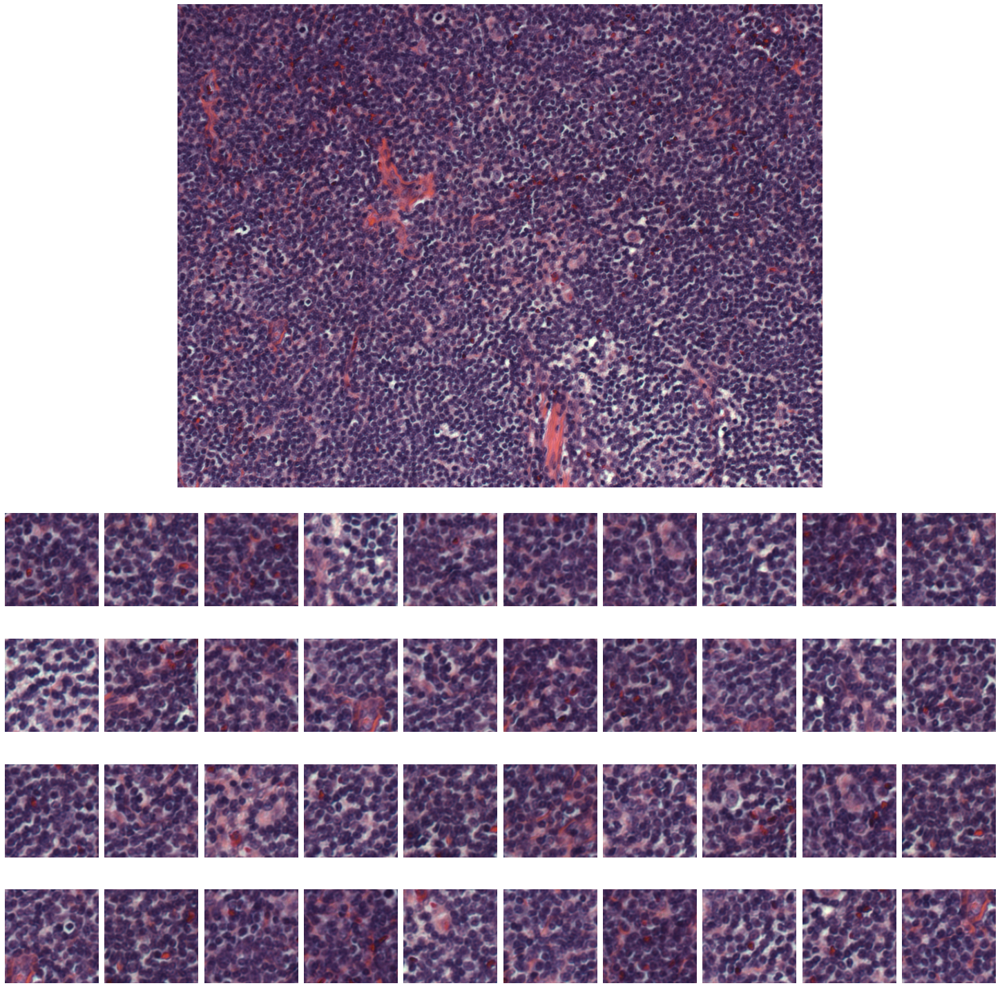

In [10]:
#image index
ids = 45

fig = plt.figure(constrained_layout=True,figsize=(20,20))
gs = fig.add_gridspec(2,10) #create a grid inside the figure of size 2x10

ax = fig.add_subplot(gs[0,:]) #plot the full image in the first row of the grid
ax.axis('off')
ax.imshow(test_dataset[ids][2])

gs2 = gs[1,:].subgridspec(4,10) #create a subgrid on the second row of the grid of size 4x10

for i,data in enumerate(test_dataset[ids][0]):#plot each patch in the element of the subgrid
    ax = fig.add_subplot(gs2[i])
    ax.axis('off')
    imagergb = cv2.cvtColor(data.reshape(3,128,128).transpose(1,2,0), cv2.COLOR_BGR2RGB) #convert the patch to RGB color space
    ax.imshow(imagergb)

## Neural network

In [11]:
torch.cuda.empty_cache()
gc.collect()

20

### Models definition

In [12]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        
        #encoder
        self.convE1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convE2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convE3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.flatten = nn.Flatten()
        self.BNE16 = nn.BatchNorm2d(16)
        self.BNE32 = nn.BatchNorm2d(32)
        self.BNE64 = nn.BatchNorm2d(64)
        self.linearE1 = nn.Linear(14400,50)
        self.linearE2 = nn.Linear(50,3)
        self.BNE150linear = nn.BatchNorm1d(50)
        
        self.act = nn.LeakyReLU()
        self.drop = nn.Dropout(p=0.1)
        
        #decoder
        
        self.convD1 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convD2 = nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convD3 = nn.ConvTranspose2d(in_channels=16, out_channels=3, kernel_size=(3,3), 
                                         stride=(2,2), padding=(0,0), dilation=1,output_padding=(1,1))
        self.reshape = nn.Unflatten(-1, (64,15,15))
        self.BND16 = nn.BatchNorm2d(16)
        self.BND32 = nn.BatchNorm2d(32)
        self.linearD1 = nn.Linear(3,50)
        self.linearD2 = nn.Linear(50,14400)
        self.BND150linear = nn.BatchNorm1d(50)
        self.BND16klinear = nn.BatchNorm1d(14400)
        
        self.out = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x):

        x1 = self.act(self.BNE16(self.convE1(x)))
        x2 = self.act(self.BNE32(self.convE2(x1)))
        x3 = self.act(self.BNE64(self.convE3(x2)))
        x3linear = self.flatten(x3)
        x4 = self.drop(self.act(self.BNE150linear(self.linearE1(x3linear))))
        x5 = self.linearE2(x4)

        x = self.act(self.BND150linear(self.linearD1(x5)))
        x = self.act(self.BND16klinear(self.linearD2(x+x4)))
        x = self.reshape(x)
        x = self.act(self.BND32(self.convD1(x+x3)))
        x = self.act(self.BND16(self.convD2(x+x2)))
        x = self.out(self.convD3(x+x1))

        return x,self.softmax(x5)

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(BOLD+"You are working on: "+END+str(device))

You are working on: cpu


### Loading of the models

In [14]:
if(LOAD_MODEL):
    
    if(not (MODEL_ALREADY_DOWNLOADED or MODEL_ALREADY_UNZIPPED)):
        print(BOLD+"Download the model"+END)
        
        url = 'https://drive.google.com/u/0/uc?id=13grwNiSwz6UrG2B6JHBTMb_ApHi2ipnV&export=download'
        output = 'models.zip'
        gdown.download(url, output, quiet=False)
        
    if(not MODEL_ALREADY_UNZIPPED):
        
        print(BOLD+"Extract the model"+END)
        
        with zipfile.ZipFile("models.zip", 'r') as zip_ref:
            zip_ref.extractall("./models/")

Extract the model


In [15]:
autoencoder = Autoencoder().to(device)
summary(autoencoder, (3, 128, 128), batch_size=batch_size)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [75, 16, 63, 63]             448
       BatchNorm2d-2           [75, 16, 63, 63]              32
         LeakyReLU-3           [75, 16, 63, 63]               0
            Conv2d-4           [75, 32, 31, 31]           4,640
       BatchNorm2d-5           [75, 32, 31, 31]              64
         LeakyReLU-6           [75, 32, 31, 31]               0
            Conv2d-7           [75, 64, 15, 15]          18,496
       BatchNorm2d-8           [75, 64, 15, 15]             128
         LeakyReLU-9           [75, 64, 15, 15]               0
          Flatten-10                [75, 14400]               0
           Linear-11                   [75, 50]         720,050
      BatchNorm1d-12                   [75, 50]             100
        LeakyReLU-13                   [75, 50]               0
          Dropout-14                   

### Training 

The accuracy in the training is patch wise while the accuracy in validation and test is image wise(i.e. the most common class for the patches of the same image)

In [16]:
def test(dataset,name):
    
    losses_ae = []
    losses_c = []
    count_correct = 0
    count_input = 0
    
    real_labels = []
    predicted_labels = []
    

    autoencoder.eval()
    
    #single image
    for data in tqdm(dataset,desc = name +" set"):
        pred = []
        labels = torch.tensor(data[1]).to(device)
        true_image_label = labels.to("cpu").detach().numpy().argmax(axis=1)[0]
        
        #iterate over all the patches of the image
        for patch in data[0]:
            
            img = torch.tensor(patch).to(device)
            
            rec_img,pred_labels= autoencoder(img)  
            
            classifier_loss = criterion_classifier(pred_labels, labels)
            ae_loss= criterion_ae(img,rec_img)
        
            losses_ae.append(ae_loss.detach().cpu().numpy())
            losses_c.append(classifier_loss.detach().cpu().numpy())
            
            pred.append(pred_labels.to("cpu").detach().numpy().argmax(axis=1)[0])
            
        
        #complete one image
        count_input += 1
        
        #compute prediction of the current image: majority class in the list of patches
        final_image_label = max(set(pred), key=pred.count) 
        
        count_correct+= (final_image_label == true_image_label)
        
        del img
        del labels
        torch.cuda.empty_cache()
        gc.collect();
        
        predicted_labels.append(final_image_label)
        real_labels.append(true_image_label)
        

    # Print loss at end of each epoch
    accuracy= (count_correct/count_input)*100.
    
    print(name,': Autoencoder Loss: %.4f, Classifier Loss: %.4f, Accuracy: %.4f in %d input samples\n'
      % (np.mean(losses_ae), np.mean(losses_c),accuracy,count_input))
    
    return np.mean(losses_ae),np.mean(losses_c),accuracy,real_labels,predicted_labels

In [17]:
criterion_classifier = nn.CrossEntropyLoss()
criterion_ae = nn.MSELoss()

def train(train_dataloader,val_dataset):
    optimizer_ae = optim.RMSprop(autoencoder.parameters(), lr=learning_rate,weight_decay=1e-2)

    
    
    best_epoch = 0 #(based on the validation accuracy)
    best_accuracy = -np.inf
    
    #for plotting: mantain the mean of the losse of the batches and the accuracy at the end of each epochs
    train_loss_ae_trend = []
    train_loss_c_trend = []
    train_accuracy_trend =[]
    val_loss_ae_trend = []
    val_loss_c_trend = []
    val_accuracy_trend = []

    
    for epoch in range(num_epochs):

        ######training#####
        #list containing the losses of each batch
        losses_ae = []
        losses_c = []
        
        #used to compute the accuracy at the end of one epoch
        count_correct = 0
        count_input = 0

        autoencoder.train()
       
        
        #train classifier for one epoch    
        for data in tqdm(train_dataloader,desc = "TRAIN Epoch [%d/%d]"%(epoch+1,num_epochs)):
            
            #extraxting the data from the dataloader
            img, labels = data
            img = img.to(device)
            labels = labels.to(device)
        
        
            optimizer_ae.zero_grad()
            
            #compute output
            rec_img,pred_labels= autoencoder(img)  
            
            #compute losses
            classifier_loss = criterion_classifier(pred_labels, labels)
            ae_loss = criterion_ae(img,rec_img)
            
            #loss used for the training = Cross Entropy + mse_weight x MSE
            total_loss = classifier_loss+mse_weight*ae_loss
            
            #compute gradient
            total_loss.backward()
            
            #update the weights
            optimizer_ae.step()
            
            #add the losses of the current batch to the lists
            losses_ae.append(ae_loss.detach().cpu().numpy())
            losses_c.append(classifier_loss.detach().cpu().numpy())

            #update the counter of the correc classify data 
            count_input+=pred_labels.detach().cpu().numpy().shape[0]
            count_correct+=np.sum((labels.to("cpu").detach().numpy().argmax(axis=1)==pred_labels.to("cpu").detach().numpy().argmax(axis=1)))
            
            #remove useless data from the ram
            del img
            del labels
            torch.cuda.empty_cache()
            gc.collect();
        
        #compute accuracy and print the results
        accuracy = (count_correct/count_input)*100.
        
        print('TRAIN: Epoch [%d/%d], Autoencoder Loss: %.4f, Classifier Loss: %.4f, Accuracy: %.4f in %d input patches \n'
              % (epoch+1, num_epochs, np.mean(losses_ae), np.mean(losses_c),accuracy,count_input))
        
        
        #summary of the entire epochs
        train_loss_ae_trend.append(np.mean(losses_ae))
        train_loss_c_trend.append(np.mean(losses_c))
        train_accuracy_trend.append(accuracy)
        
        ######validation######
        ae,c,acc,_,_ = test(val_dataset,"VALIDATION")
        
        val_loss_ae_trend.append(ae)
        val_loss_c_trend.append(c)
        val_accuracy_trend.append(acc)
        
        if acc > best_accuracy:
            print(GREEN+"Saved Model: "+END+UNDERLINE+"best validation accuracy reached\n\n"+END)
            best_epoch = epoch+1
            torch.save(autoencoder.state_dict(), os.path.join(models_dir,str(mse_weight)+"_best_ae.pt"))
            
            best_accuracy = acc
        

    return np.array([[train_loss_ae_trend,train_loss_c_trend,train_accuracy_trend],
            [val_loss_ae_trend,val_loss_c_trend,val_accuracy_trend],best_epoch],dtype=np.object_)

In [18]:
#training or loading the results of a pre-trained model
if(not LOAD_MODEL):
    
    results = train(train_dataloader,val_dataset) 
    np.save(os.path.join(models_dir,str(mse_weight)+"_results.npy"),results)
    
else:
    mse_weight = 50 #the loaded model used a mse_weight = 50
    results = np.load(os.path.join(models_dir,"50_results_stefano.npy"),allow_pickle=True)

In [19]:
#always load the best model after the training
autoencoder.load_state_dict(torch.load(os.path.join(models_dir,str(mse_weight)+"_best_ae_stefano.pt"),map_location=device))
autoencoder.eval();

### Plot of the losses and accuracy

In [20]:
#train
train_ae = results[0][0] #mse
train_c = results[0][1] #cross entropy
train_acc = results[0][2] #accuracy patches level

#validation
val_ae = results[1][0] #mse
val_c = results[1][1] #cross entropy
val_acc = results[1][2] #accuracy images level

#best epoch number
best_epoch = results[2]

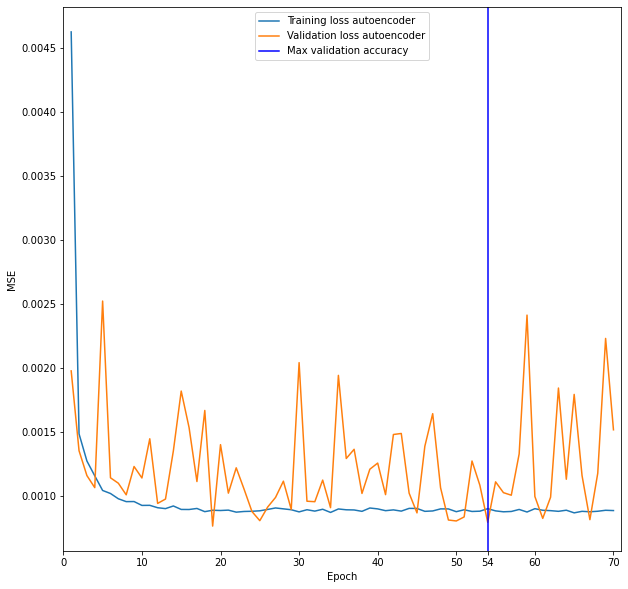

In [21]:
#generating the batch indexes
batchID = np.array([i+1 for i in range(len(train_ae))])

plt.figure(figsize=(10,10))

#plotting the losses
plt.plot(batchID,train_ae,label = "Training loss autoencoder")
plt.plot(batchID,val_ae, label = "Validation loss autoencoder")
plt.xlabel("Epoch")
plt.ylabel("MSE")

#showing the position of the best values
plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

#adding the position of the best values in the x axis
ticks = list(plt.xticks()[0]) 
ticks_copy = []
for element in ticks:
    if abs(element-best_epoch)>=3:
        ticks_copy.append(element)
ticks_copy.extend([best_epoch])
plt.xticks(ticks_copy)

#limit the plot x-values
plt.xlim(0,batchID.max()+1)

plt.legend()

#saving the figure
if(SAVE_FIG):
    plt.savefig(str(mse_weight)+"_training-val_mse")
plt.show()

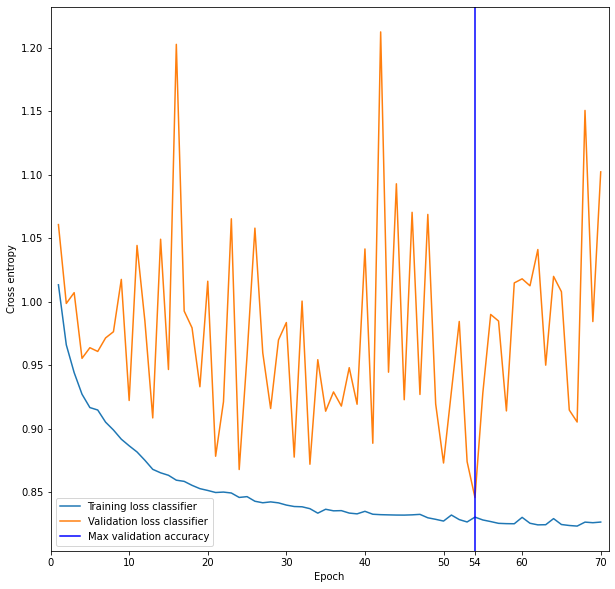

In [22]:
plt.figure(figsize=(10,10))

#plotting the losses
plt.plot(batchID,train_c,label = "Training loss classifier")
plt.plot(batchID,val_c, label = "Validation loss classifier")
plt.xlabel("Epoch")
plt.ylabel("Cross entropy")

#showing the position of the best values
plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

#adding the position of the best values in the x axis
ticks = list(plt.xticks()[0]) 
ticks_copy = []
for element in ticks:
    if abs(element-best_epoch)>=3:
        ticks_copy.append(element)
ticks_copy.extend([best_epoch])
plt.xticks(ticks_copy)

#limit the plot x-values
plt.xlim(0,batchID.max()+1)

plt.legend()

#saving the figure
if(SAVE_FIG):
    plt.savefig(str(mse_weight)+"_train-val_ce")
plt.show()

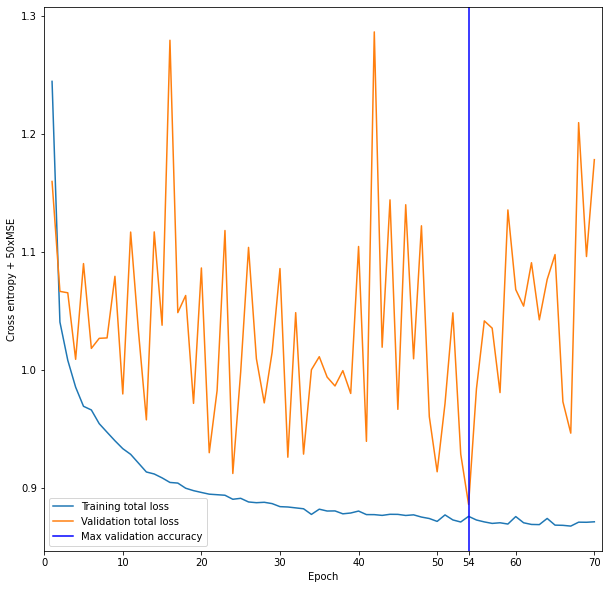

In [23]:
plt.figure(figsize=(10,10))

#plotting the losses
plt.plot(batchID,train_c+mse_weight*np.ones(len(batchID))*train_ae,label = "Training total loss")
plt.plot(batchID,val_c+mse_weight*np.ones(len(batchID))*val_ae, label = "Validation total loss")
plt.xlabel("Epoch")
plt.ylabel("Cross entropy + "+str(mse_weight)+"xMSE")

#showing the position of the best values
plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

#adding the position of the best values in the x axis
ticks = list(plt.xticks()[0])
ticks_copy = []
for element in ticks:
    if abs(element-best_epoch)>=3:
        ticks_copy.append(element)
ticks_copy.extend([best_epoch])
plt.xticks(ticks_copy)

#limit the plot x-values
plt.xlim(0,batchID.max()+1)

plt.legend()

#saving the figure
if(SAVE_FIG):
    plt.savefig(str(mse_weight)+"_train-val_totalloss")
plt.show()

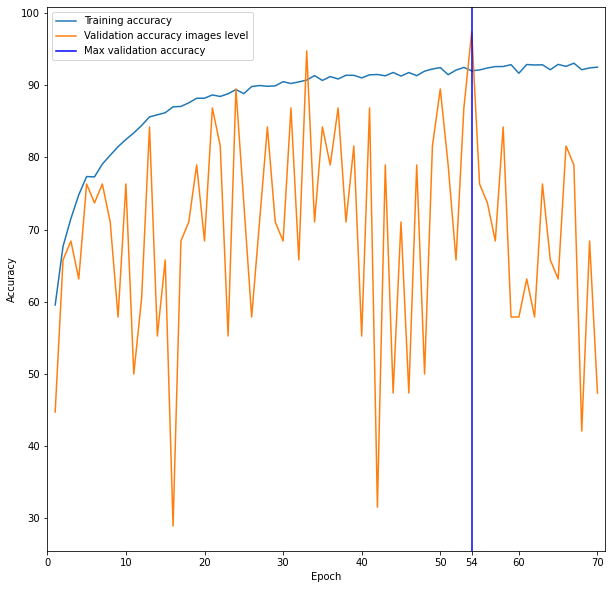

In [24]:
plt.figure(figsize=(10,10))

#plotting the accuracy
plt.plot(batchID,train_acc,label = "Training accuracy")
plt.plot(batchID,val_acc, label = "Validation accuracy images level")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

#showing the position of the best values
plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

#adding the position of the best values in the x axis
ticks = list(plt.xticks()[0]) 
ticks_copy = []
for element in ticks:
    if abs(element-best_epoch)>=3:
        ticks_copy.append(element)
ticks_copy.extend([best_epoch])
plt.xticks(ticks_copy)

#limit the plot x-values
plt.xlim(0,batchID.max()+1)

plt.legend()

#saving the figure
if(SAVE_FIG):
    plt.savefig(str(mse_weight)+"_train-val_accuracy")
plt.show()

### Network processing inspection

New class that returns also the intermediate results

In [25]:
class Autoencoder_visualization(nn.Module):
    def __init__(self):
        super(Autoencoder_visualization, self).__init__()
        
        #encoder
        self.convE1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convE2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convE3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.flatten = nn.Flatten()
        self.BNE16 = nn.BatchNorm2d(16)
        self.BNE32 = nn.BatchNorm2d(32)
        self.BNE64 = nn.BatchNorm2d(64)
        self.linearE1 = nn.Linear(14400,50)
        self.linearE2 = nn.Linear(50,3)
        self.BNE150linear = nn.BatchNorm1d(50)
        
        self.act = nn.LeakyReLU()
        self.drop = nn.Dropout(p=0.1)
        
        #decoder
        
        self.convD1 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convD2 = nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=(3,3), stride=(2,2), padding=(0,0))
        self.convD3 = nn.ConvTranspose2d(in_channels=16, out_channels=3, kernel_size=(3,3), 
                                         stride=(2,2), padding=(0,0), dilation=1,output_padding=(1,1))
        self.reshape = nn.Unflatten(-1, (64,15,15))
        self.BND16 = nn.BatchNorm2d(16)
        self.BND32 = nn.BatchNorm2d(32)
        self.linearD1 = nn.Linear(3,50)
        self.linearD2 = nn.Linear(50,14400)
        self.BND150linear = nn.BatchNorm1d(50)
        self.BND16klinear = nn.BatchNorm1d(14400)
        
        self.out = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)
        
    def forward(self, x):

        x1 = self.act(self.BNE16(self.convE1(x)))
        x2 = self.act(self.BNE32(self.convE2(x1)))
        x3 = self.act(self.BNE64(self.convE3(x2)))
        x3linear = self.flatten(x3)
        x4 = self.drop(self.act(self.BNE150linear(self.linearE1(x3linear))))
        x5 = self.linearE2(x4)

        x = self.act(self.BND150linear(self.linearD1(x5)))
        x = self.act(self.BND16klinear(self.linearD2(x+x4)))
        x = self.reshape(x)
        x = self.act(self.BND32(self.convD1(x+x3)))
        x = self.act(self.BND16(self.convD2(x+x2)))
        x = self.out(self.convD3(x+x1))

        return x, self.softmax(x5), x1, x2, x3, x4, x5

In [26]:
def plot_channels(image, n_rows, n_cols):
    fig = plt.figure(constrained_layout=True,figsize=(20,5*n_rows))
    gs = fig.add_gridspec(2,8)
    gs2 = gs[1,:].subgridspec(n_rows, n_cols)

    for ch in range(image.shape[0]):
    
        ax = fig.add_subplot(gs2[ch])
    
        ax.set_title("CH:"+str(ch),fontsize=15)
        ax.imshow(image[ch], cmap = 'Greys')

In [27]:
autoencoder2 =  Autoencoder_visualization().to(device)
autoencoder2.load_state_dict(torch.load(os.path.join(models_dir,str(mse_weight)+"_best_ae.pt"), map_location=device))
autoencoder2.eval();

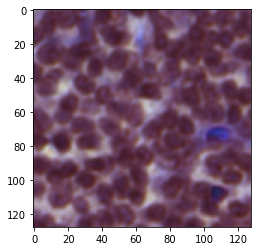

In [28]:
subpatch = 1 # choose the patch of image ids
rec_img, pred_labels, img1, img2, img3, img4, img5 = autoencoder2(torch.tensor(test_dataset[ids][0][subpatch]).to(device))
plt.imshow(test_dataset[ids][0][subpatch].reshape(3,128,128).transpose(1,2,0))

img1 = img1.detach().cpu().numpy()
img2 = img2.detach().cpu().numpy()
img3 = img3.detach().cpu().numpy()
img4 = img4.detach().cpu().numpy()
img5 = img5.detach().cpu().numpy()

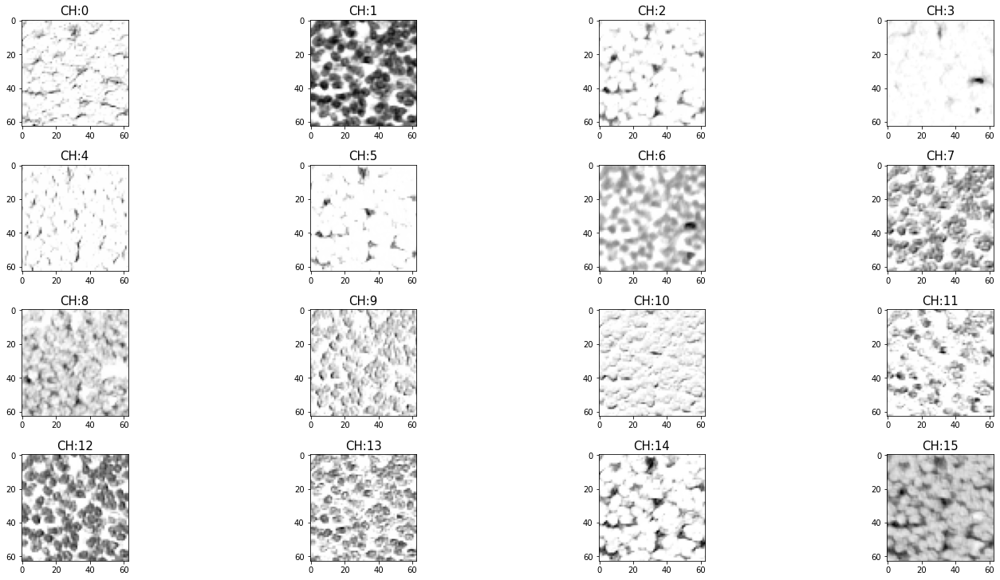

In [29]:
plot_channels(img1[0], n_rows = 4, n_cols = 4)

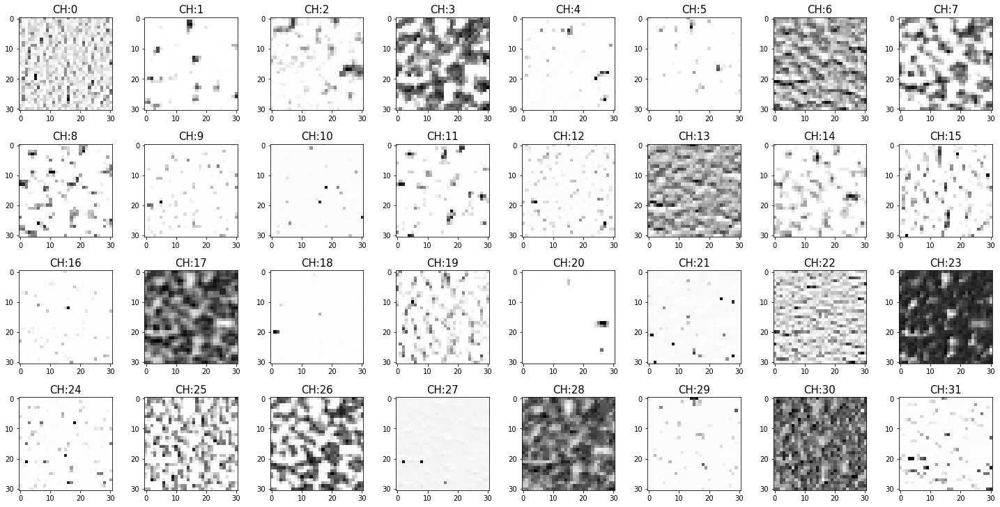

In [30]:
plot_channels(img2[0], n_rows = 4, n_cols = 8)

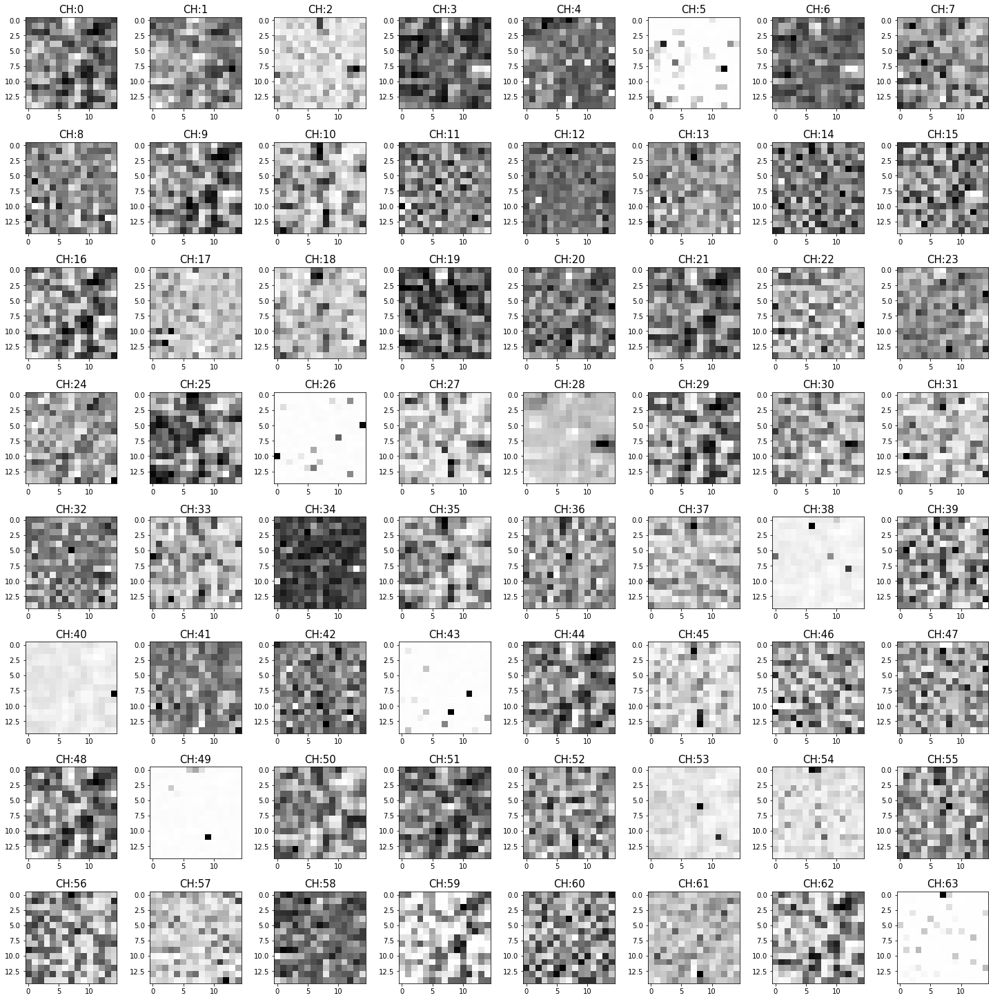

In [31]:
plot_channels(img3[0], n_rows = 8, n_cols = 8)

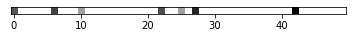

In [34]:
fig = plt.imshow(img4, cmap = 'Greys')
fig.axes.get_yaxis().set_visible(False)

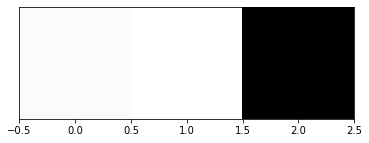

In [35]:
fig = plt.imshow(img5, cmap = 'Greys')
fig.axes.get_yaxis().set_visible(False)

### Test

Notice that the value of the losses and the accuracy for the train set are computed during the training, so they are not very accurate.

In [36]:
def print_confusion_matrix_pandas(labels,predictions,title,save_img = False):
    
    # Get the confusion matrix using sklearn.
    cm = confusion_matrix(y_true=labels, y_pred=predictions)
    # Plot the confusion matrix as an image.
    class_names = name_to_id.keys()
    df_cm = pd.DataFrame(cm, index = class_names, columns = class_names)
    plt.figure(figsize = (15,10))
    sn.heatmap(df_cm, annot=True, cmap='Blues')
    #plt.axis([-0.5, 13.5, 13.5, -0.5])
    plt.title(title,fontsize=20)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    
    # Ensure the plot is shown correctly with multiple plots
    # in a single Notebook cell.
    if save_img:
        plt.savefig("./"+title+".png")
    plt.show()
    
    return cm

In [37]:
#create a new dataset objet for the train (we don't need to add noise for the test)

train_dir = os.path.join(data_dir,"train","images")#images
train_dir_patches = os.path.join(data_dir,"train","images_patch")#patches
train_labels_dir = os.path.join(data_dir,"train","labels","train.json")
with open(train_labels_dir) as f:
    train_labels = json.load(f)#labels

train_dataset = HDAdatasetPatches(train_dir,train_dir_patches,train_labels,train = False,
                          grayscale=grayscale,fft=fft)

In [38]:
_,_,_,real_train,pred_train = test(train_dataset,"TRAIN")
_,_,_,real_val,pred_val = test(val_dataset,"VALIDATION")
_,_,_,real_test,pred_test = test(test_dataset,"TEST");

TRAIN set: 100%|██████████| 261/261 [01:51<00:00,  2.34it/s]


TRAIN : Autoencoder Loss: 0.0008, Classifier Loss: 0.8080, Accuracy: 98.8506 in 261 input samples



TEST set:   0%|          | 0/75 [00:00<?, ?it/s]

VALIDATION : Autoencoder Loss: 0.0008, Classifier Loss: 0.8457, Accuracy: 97.3684 in 38 input samples



TEST set: 100%|██████████| 75/75 [00:30<00:00,  2.49it/s]

TEST : Autoencoder Loss: 0.0008, Classifier Loss: 0.8552, Accuracy: 92.0000 in 75 input samples



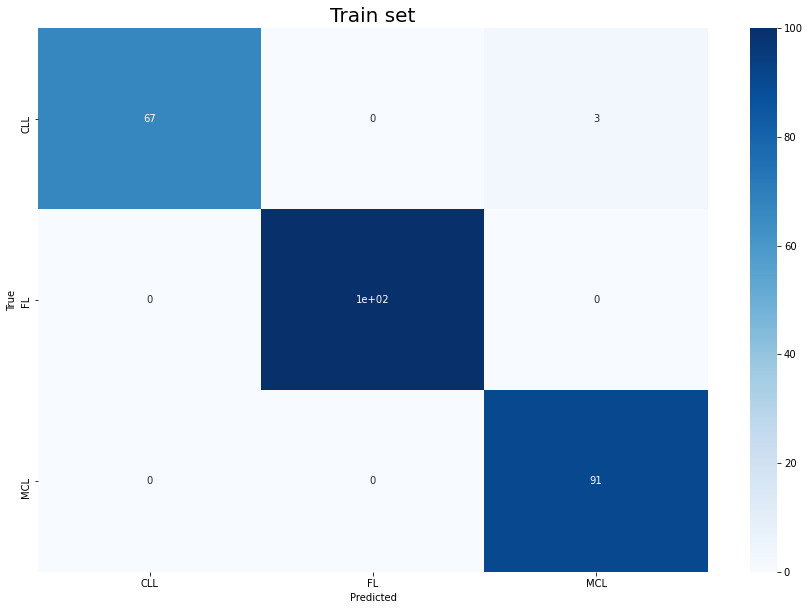

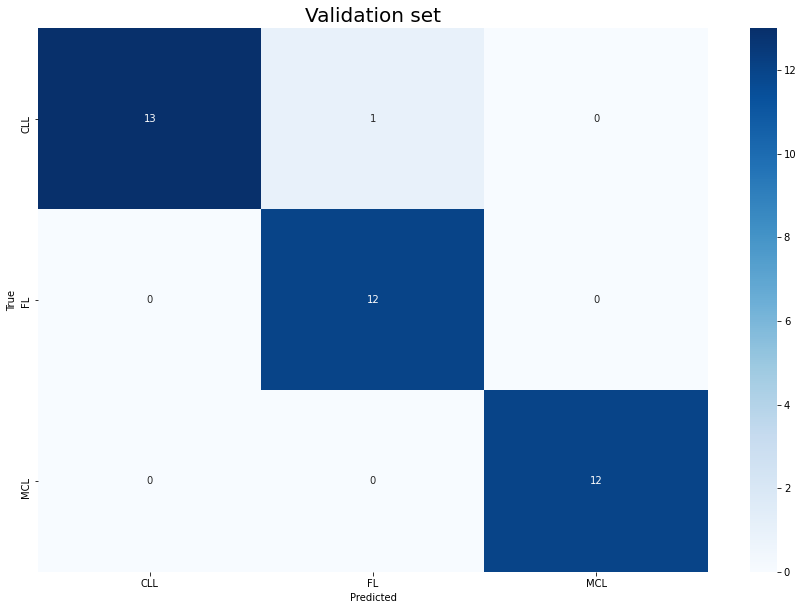

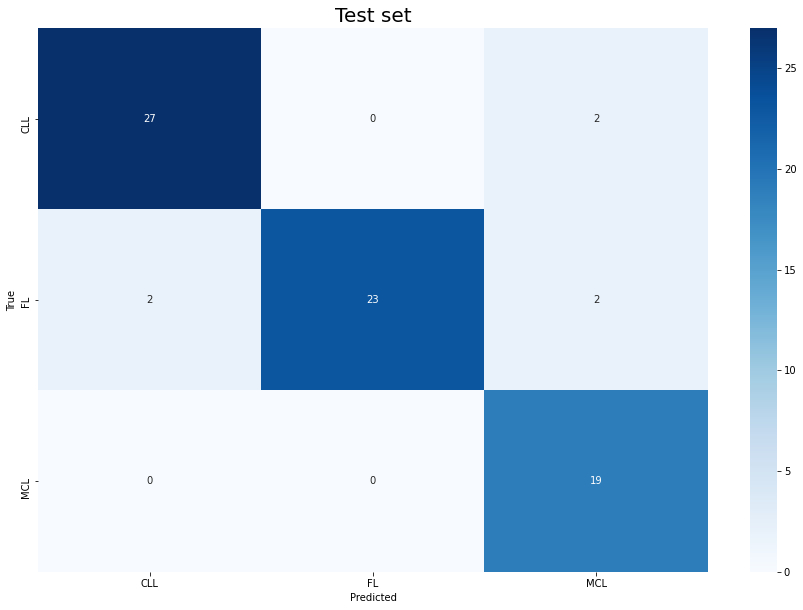

In [39]:
print_confusion_matrix_pandas(real_train,pred_train,"Train set",save_img = SAVE_FIG)
print_confusion_matrix_pandas(real_val,pred_val,"Validation set",save_img = SAVE_FIG)
print_confusion_matrix_pandas(real_test,pred_test,"Test set",save_img = SAVE_FIG);

In [40]:
def plot_classification(dataset, idx):
    
    fig = plt.figure(constrained_layout=True,figsize=(20,20))
    gs = fig.add_gridspec(2,10)
    gs2 = gs[1,:].subgridspec(4,10)

    pred=[]
    labels = torch.tensor(dataset[idx][1]).to(device)
    true_image_label = labels.to("cpu").detach().numpy().argmax(axis=1)[0]

    count = {0:0,1:0,2:0}

    for i,patch in enumerate(dataset[idx][0]):

        ax = fig.add_subplot(gs2[i])


        img = torch.tensor(patch).to(device)

        rec_img,pred_labels= autoencoder(img)  


        curr = pred_labels.to("cpu").detach().numpy().argmax(axis=1)[0]

        count[curr] = count[curr]+1

        pred.append(curr)

        ax.set_title(" pred: "+r"$\bf{" + id_to_name[curr]  + "}$",fontsize=15)

        imagergb = cv2.cvtColor(patch.reshape(3,128,128).transpose(1,2,0), cv2.COLOR_BGR2RGB)
        ax.imshow(imagergb)
        ax.set_xticks([])
        ax.set_yticks([])

        if(true_image_label == curr):
            for axis in ['top', 'bottom', 'left', 'right']:
                ax.spines[axis].set_linewidth(4)  # change width
                ax.spines[axis].set_color('green')    # change color
        else:
            for axis in ['top', 'bottom', 'left', 'right']:
                ax.spines[axis].set_linewidth(4)  # change width
                ax.spines[axis].set_color('red')    # change color

    final_image_label = max(set(pred), key=pred.count) 


    ax = fig.add_subplot(gs[0,:])
    ax.set_title("true: "+r"$\bf{" + id_to_name[true_image_label]  + "}$"+ " pred: "+r"$\bf{" + id_to_name[final_image_label]  + "}$", fontsize=15)
    ax.imshow(test_dataset[ids][2])

    ax.text(test_dataset[ids][2].shape[1]+15,15,"Patches count:", fontsize=20,weight='bold')
    ax.text(test_dataset[ids][2].shape[1]+15,45,id_to_name[0]+": "+str(count[0]), fontsize=20)
    ax.text(test_dataset[ids][2].shape[1]+15,75,id_to_name[1]+": "+str(count[1]), fontsize=20)
    ax.text(test_dataset[ids][2].shape[1]+15,105,id_to_name[2]+": "+str(count[2]), fontsize=20)
    ax.set_xticks([])
    ax.set_yticks([])

    if(true_image_label == final_image_label):
        for axis in ['top', 'bottom', 'left', 'right']:
            ax.spines[axis].set_linewidth(8)  # change width
            ax.spines[axis].set_color('green')    # change color
    else:
        for axis in ['top', 'bottom', 'left', 'right']:
            ax.spines[axis].set_linewidth(8)  # change width
            ax.spines[axis].set_color('red')    # change color

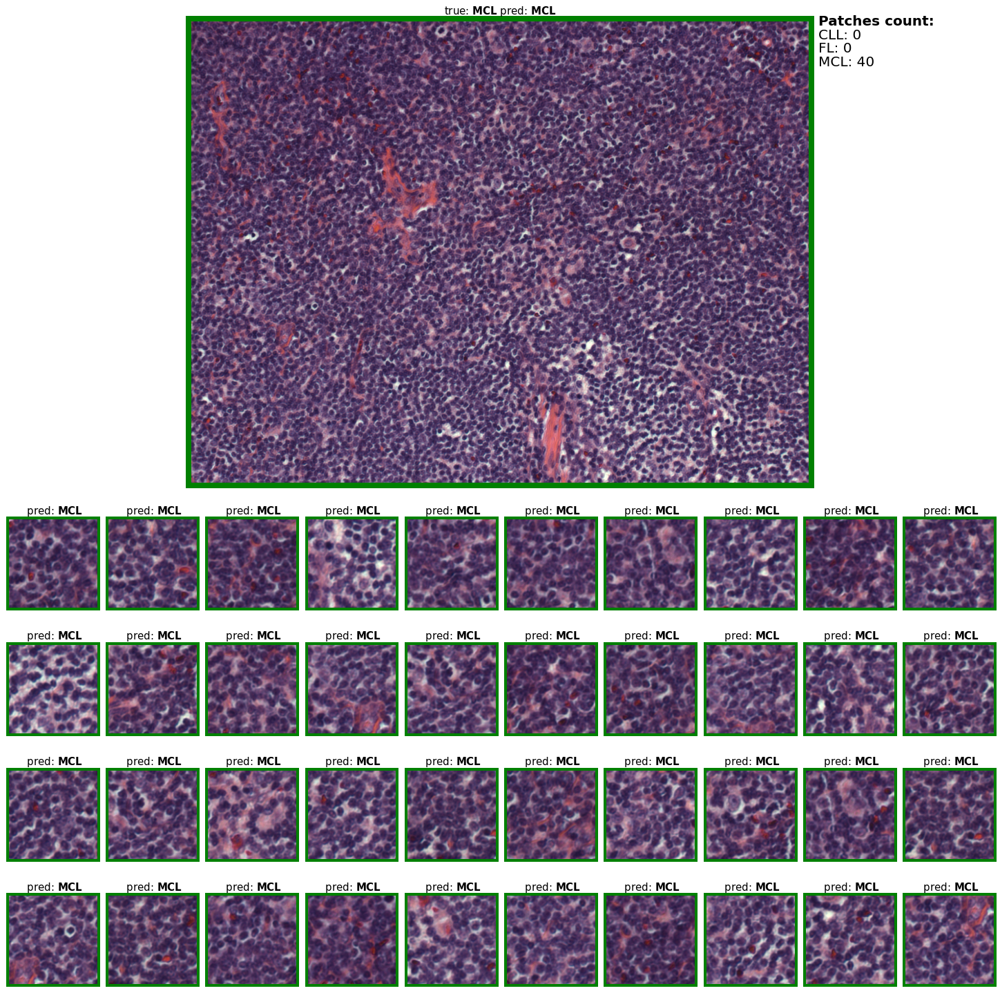

In [41]:
plot_classification(test_dataset, ids)

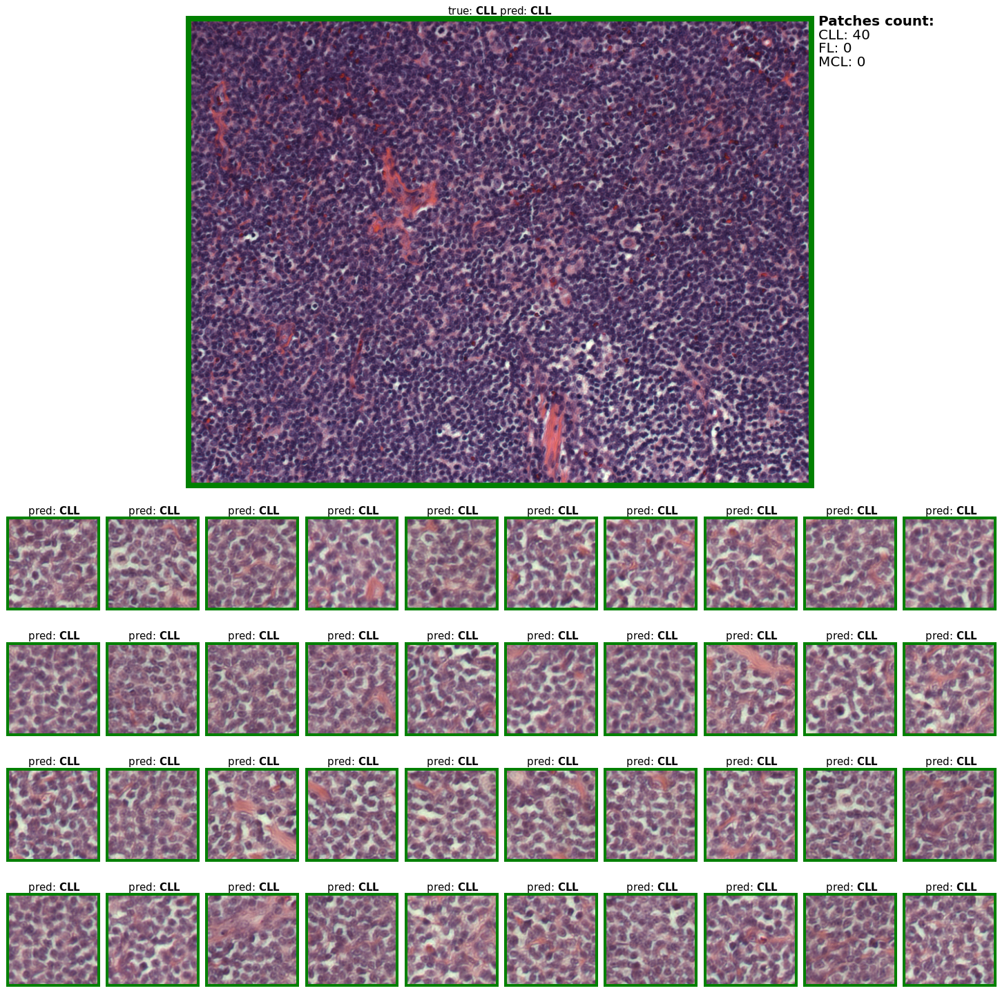

In [42]:
ids2 = 10 #use another input example 
plot_classification(test_dataset, ids2)

### Solution to the "same count problem"

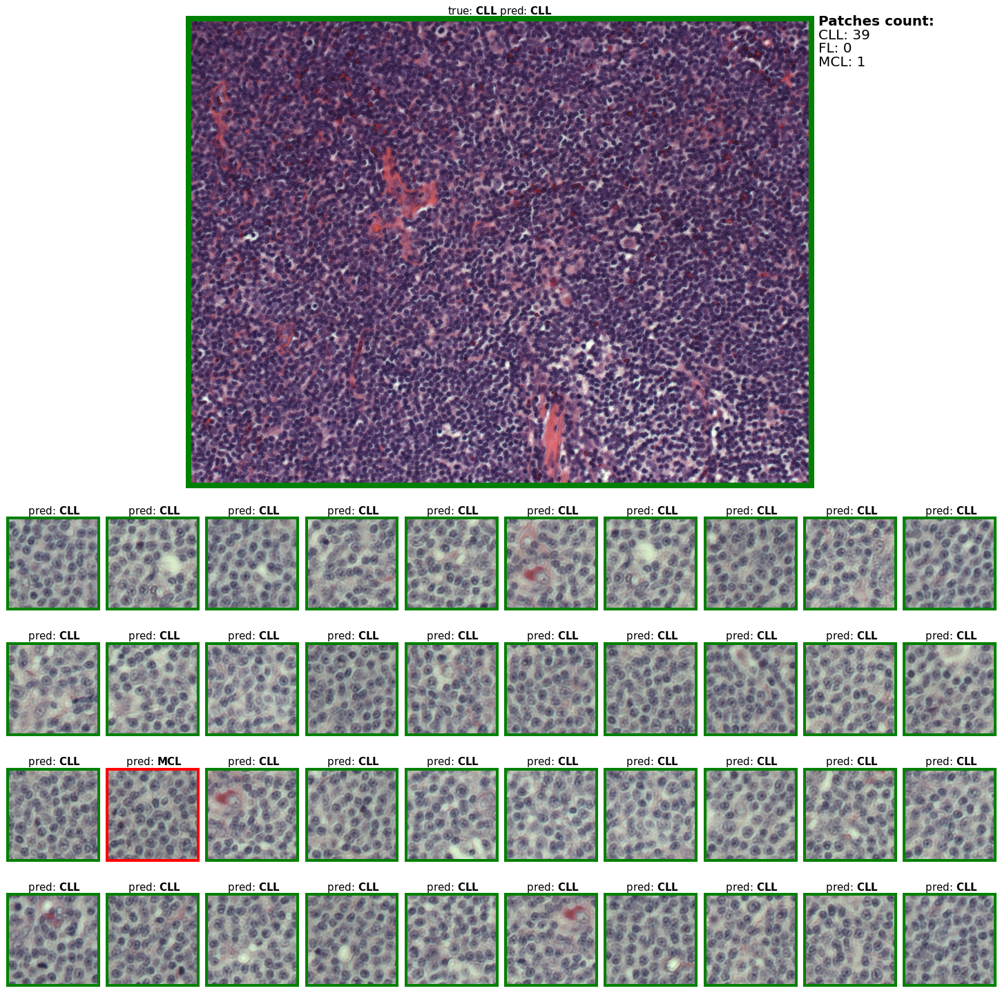

In [43]:
ids2 = 2 #use another input example 
plot_classification(test_dataset, ids2)

In [44]:
def test_modified(dataset,name):
    
    losses_ae = []
    losses_c = []
    count_correct = 0
    count_input = 0

    
    real_labels = []
    predicted_labels = []
    
    autoencoder.eval()
    
    #single image
    for data in tqdm(dataset,desc = name +" set"):
        pred = []
        labels = torch.tensor(data[1]).to(device)
        true_image_label = labels.to("cpu").detach().numpy().argmax(axis=1)[0]
        count = {0:0,1:0,2:0}
        #iterate over all the patches
        for patch in data[0]:
            
            img = torch.tensor(patch).to(device)
            
            rec_img,pred_labels= autoencoder(img)  
            
            classifier_loss = criterion_classifier(pred_labels, labels)
            ae_loss= criterion_ae(img,rec_img)

            losses_ae.append(ae_loss.detach().cpu().numpy())
            losses_c.append(classifier_loss.detach().cpu().numpy())
            
            
            weight = pred_labels.to("cpu").detach().numpy()
            for i in range(3):
                count[i] = count[i]+weight[0,i]
            
            curr = pred_labels.to("cpu").detach().numpy().argmax(axis=1)[0]
            
            pred.append(curr)
            
        count_input += 1
        
# #####modified part of the test function################

        counter = dict(Counter(pred)) #dictionari of class:count

        final_image_label = max(counter, key=counter.get) #extract the label with the max count
        max_value = counter[final_image_label] #extract the count of that label

        del counter[final_image_label] #remove the entry with the max count (now you can easily extract the second prediction
                                       # using the same procedure)*

        if len(counter.keys())!=0: #*but only if there are other possible prediction (some samples are hard classified 
                                #,i.e. all 40 patches with the same predicted class)

            second_prediction = max(counter, key=counter.get)
            second_max_value = counter[second_prediction]
            
            choice = [final_image_label,second_prediction]
            values = np.array([count[final_image_label],count[second_prediction]])

            if second_max_value == max_value: #if the two counts are the same
                final_image_label = choice[values.argmax()]
# ######################################################################### 
           
    
        count_correct+= (final_image_label == true_image_label)
        
        predicted_labels.append(final_image_label)
        real_labels.append(true_image_label)
        

    # Print loss at end of each epoch
    accuracy= (count_correct/count_input)*100.
    print(name,': Autoencoder Loss: %.4f, Classifier Loss: %.4f, Accuracy: %.4f in %d input samples\n'
      % (np.mean(losses_ae), np.mean(losses_c),accuracy,count_input))
    
    return np.mean(losses_ae),np.mean(losses_c),accuracy,real_labels,predicted_labels

In [45]:
_,_,_,real_val,pred_val = test_modified(train_dataset,"TRAIN")
_,_,_,real_val,pred_val = test_modified(val_dataset,"VALIDATION")
_,_,_,real_test,pred_test = test_modified(test_dataset,"TEST");

TRAIN set: 100%|██████████| 261/261 [01:19<00:00,  3.30it/s]


TRAIN : Autoencoder Loss: 0.0008, Classifier Loss: 0.8080, Accuracy: 98.8506 in 261 input samples



TEST set:   0%|          | 0/75 [00:00<?, ?it/s]

VALIDATION : Autoencoder Loss: 0.0008, Classifier Loss: 0.8457, Accuracy: 97.3684 in 38 input samples



TEST set: 100%|██████████| 75/75 [00:21<00:00,  3.44it/s]

TEST : Autoencoder Loss: 0.0008, Classifier Loss: 0.8552, Accuracy: 92.0000 in 75 input samples



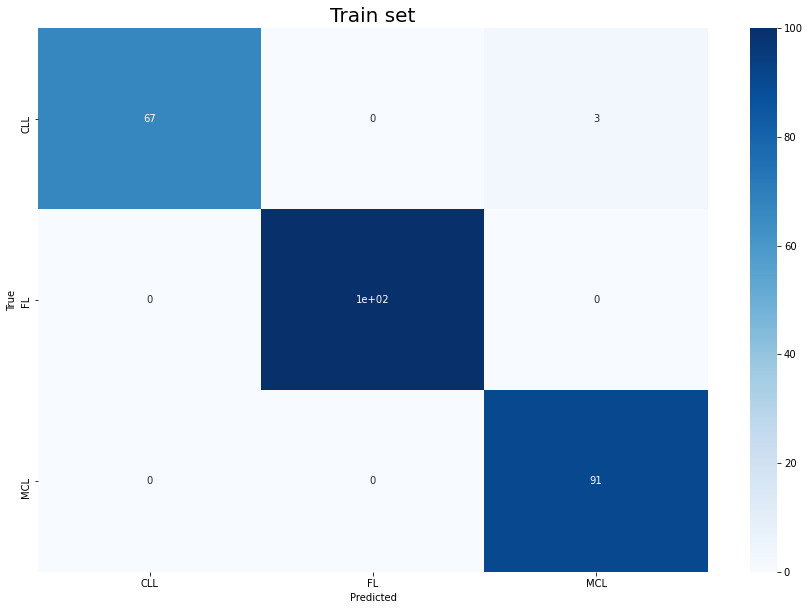

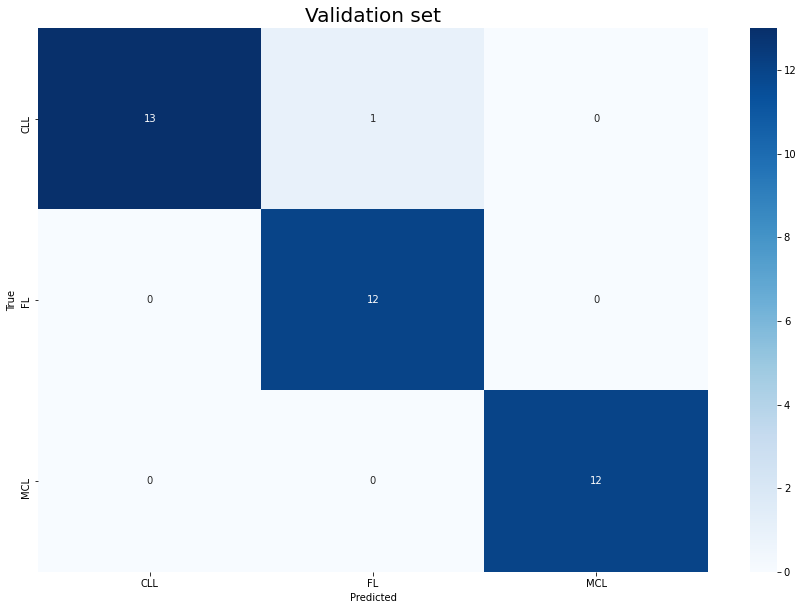

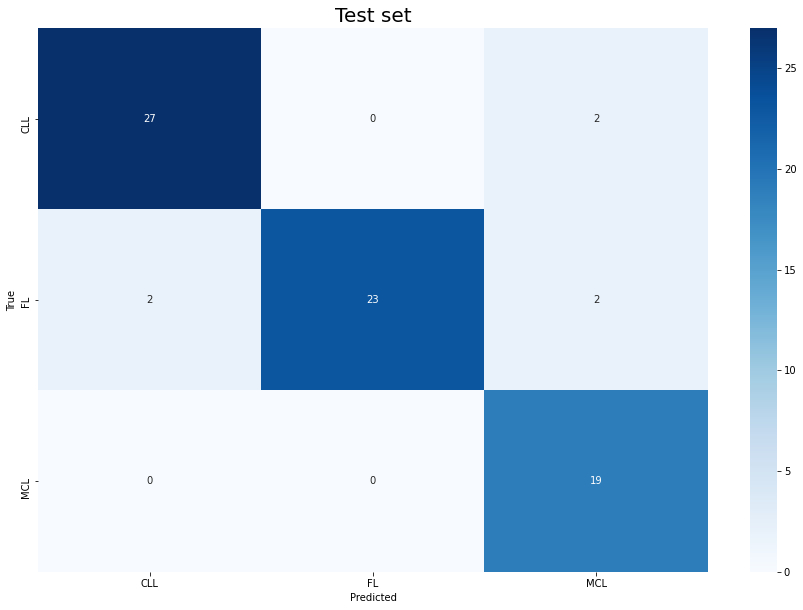

In [46]:
print_confusion_matrix_pandas(real_train,pred_train,"Train set",save_img = SAVE_FIG)
print_confusion_matrix_pandas(real_val,pred_val,"Validation set",save_img = SAVE_FIG)
print_confusion_matrix_pandas(real_test,pred_test,"Test set",save_img = SAVE_FIG);

In [47]:
def plot_classification_prob(dataset, idx):
    
    fig = plt.figure(constrained_layout=True,figsize=(20,20))
    gs = fig.add_gridspec(2,10)
    gs2 = gs[1,:].subgridspec(4,10)

    pred=[]
    labels = torch.tensor(dataset[idx][1]).to(device)
    true_image_label = labels.to("cpu").detach().numpy().argmax(axis=1)[0]

    count_weight = {0:0,1:0,2:0}
    count = {0:0,1:0,2:0}

    for i,patch in enumerate(dataset[idx][0]):

        ax = fig.add_subplot(gs2[i])


        img = torch.tensor(patch).to(device)

        rec_img,pred_labels= autoencoder(img)  
        
    

        weight = pred_labels.to("cpu").detach().numpy()
        for i in range(3):
            count_weight[i] = count_weight[i]+weight[0,i]

        curr = pred_labels.to("cpu").detach().numpy().argmax(axis=1)[0]
        count[curr] = count[curr] + 1
        
        pred.append(curr)


        string = ""
        for w in np.round(weight,2)[0]:
            string = string+str(w)+", "

        string = string[0:len(string)-2]
        ax.set_title(" pred: "+r"$\bf{"+id_to_name[curr]+"}$"+"\n weights: \n"+r"$\bf{" + string+"}$",fontsize=15)

        imagergb = cv2.cvtColor(patch.reshape(3,128,128).transpose(1,2,0), cv2.COLOR_BGR2RGB)
        ax.imshow(imagergb)
        ax.set_xticks([])
        ax.set_yticks([])

        if(true_image_label == curr):
            for axis in ['top', 'bottom', 'left', 'right']:
                ax.spines[axis].set_linewidth(4)  # change width
                ax.spines[axis].set_color('green')    # change color
        else:
            for axis in ['top', 'bottom', 'left', 'right']:
                ax.spines[axis].set_linewidth(4)  # change width
                ax.spines[axis].set_color('red')    # change color


    
    count_copy = count.copy()
    
    final_image_label = max(count, key=count.get) #extract the label with the max count
    max_value = count[final_image_label] #extract the count of that label

    del count[final_image_label] #remove the entry with the max count (now you can easily extract the second prediction
                                   # using the same procedure)*

    if len(count.keys())!=0: #*but only if there are other possible prediction (some samples are hard classified 
                            #,i.e. all 40 patches with the same predicted class)

        second_prediction = max(count, key=count.get)
        second_max_value = count[second_prediction]
        
        choice = [final_image_label,second_prediction]
        values = np.array([count_weight[final_image_label],count_weight[second_prediction]])

        if second_max_value == max_value: #if the two counts are the same
            if second_max_value == max_value: #if the two counts are the same
                final_image_label = choice[values.argmax()]


    ax = fig.add_subplot(gs[0,:])
    ax.set_title("true: "+r"$\bf{" + id_to_name[true_image_label]  + "}$"+ "pred: "+r"$\bf{" + id_to_name[final_image_label]  + "}$", fontsize=15)
    ax.imshow(test_dataset[ids2][2])

    ax.text(test_dataset[ids2][2].shape[1]+15,15,"Patches count:", fontsize=20,weight='bold')
    ax.text(test_dataset[ids2][2].shape[1]+15,45,id_to_name[0]+": "+str(count_copy[0]), fontsize=20)
    ax.text(test_dataset[ids2][2].shape[1]+15,75,id_to_name[1]+": "+str(count_copy[1]), fontsize=20)
    ax.text(test_dataset[ids2][2].shape[1]+15,105,id_to_name[2]+": "+str(count_copy[2]), fontsize=20)
    
    ax.text(test_dataset[ids2][2].shape[1]+15,140,"Patches count weighted:", fontsize=20,weight='bold')
    ax.text(test_dataset[ids2][2].shape[1]+15,175,id_to_name[0]+": "+str(count_weight[0]), fontsize=20)
    ax.text(test_dataset[ids2][2].shape[1]+15,210,id_to_name[1]+": "+str(count_weight[1]), fontsize=20)
    ax.text(test_dataset[ids2][2].shape[1]+15,245,id_to_name[2]+": "+str(count_weight[2]), fontsize=20)
    
    ax.set_xticks([])
    ax.set_yticks([])

    if(true_image_label == final_image_label):
        for axis in ['top', 'bottom', 'left', 'right']:
            ax.spines[axis].set_linewidth(8)  # change width
            ax.spines[axis].set_color('green')    # change color
    else:
        for axis in ['top', 'bottom', 'left', 'right']:
            ax.spines[axis].set_linewidth(8)  # change width
            ax.spines[axis].set_color('red')    # change color

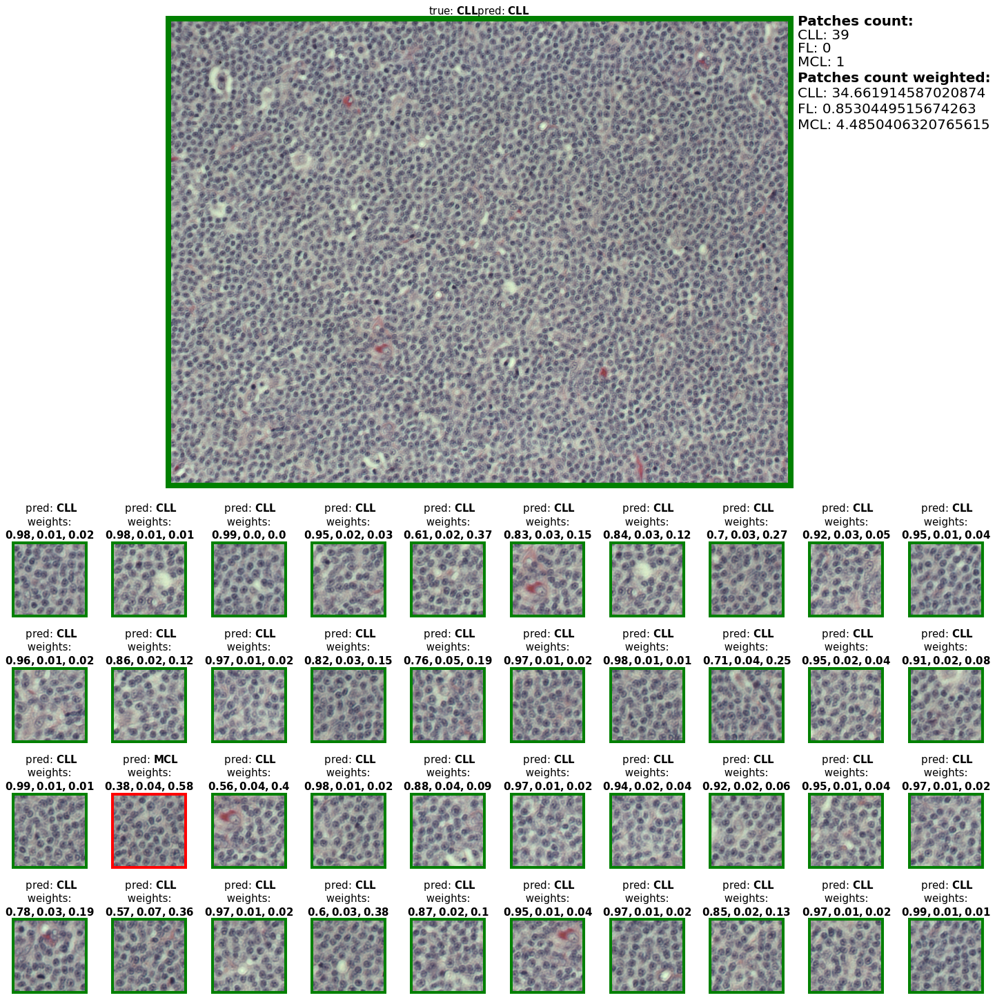

In [48]:
ids2 = 2
plot_classification_prob(test_dataset, ids2)

## Comparison without the decoder during the training

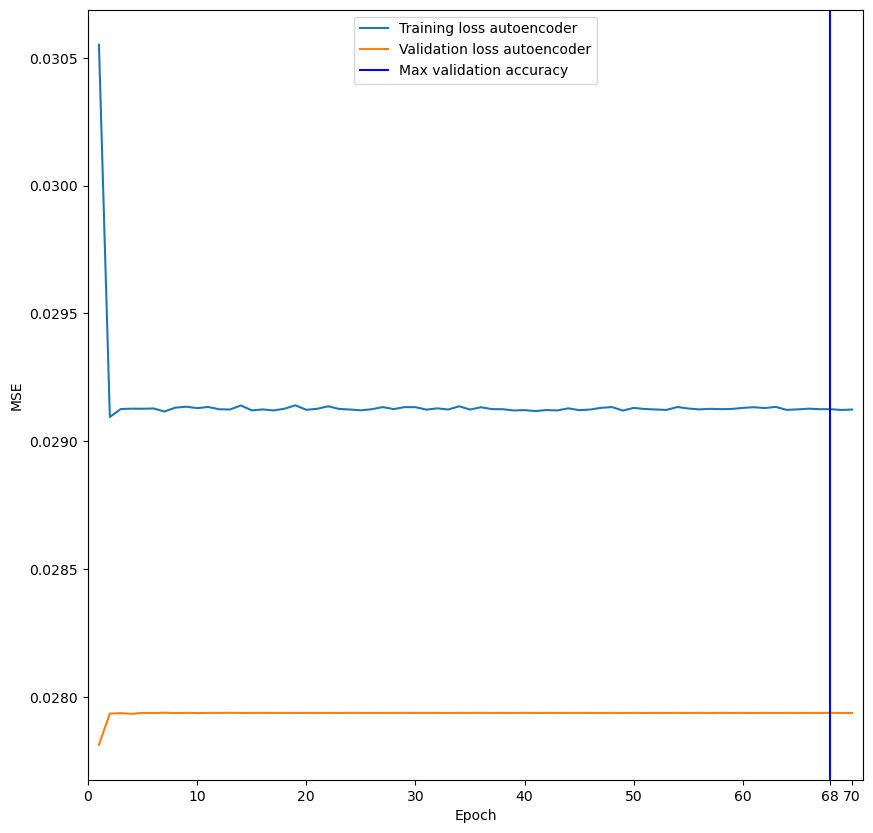

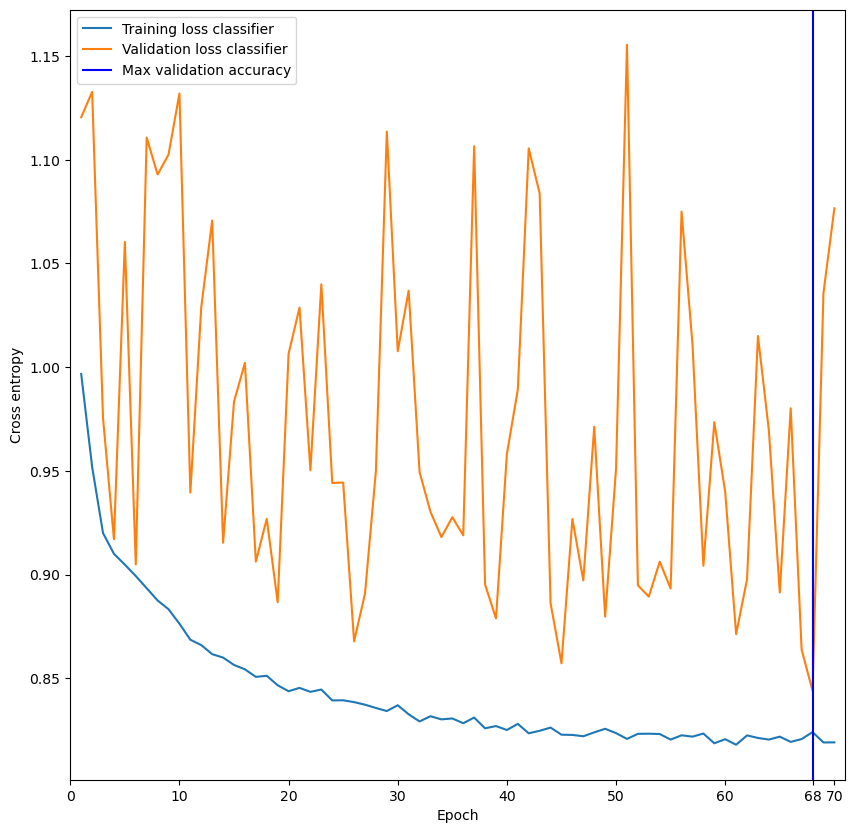

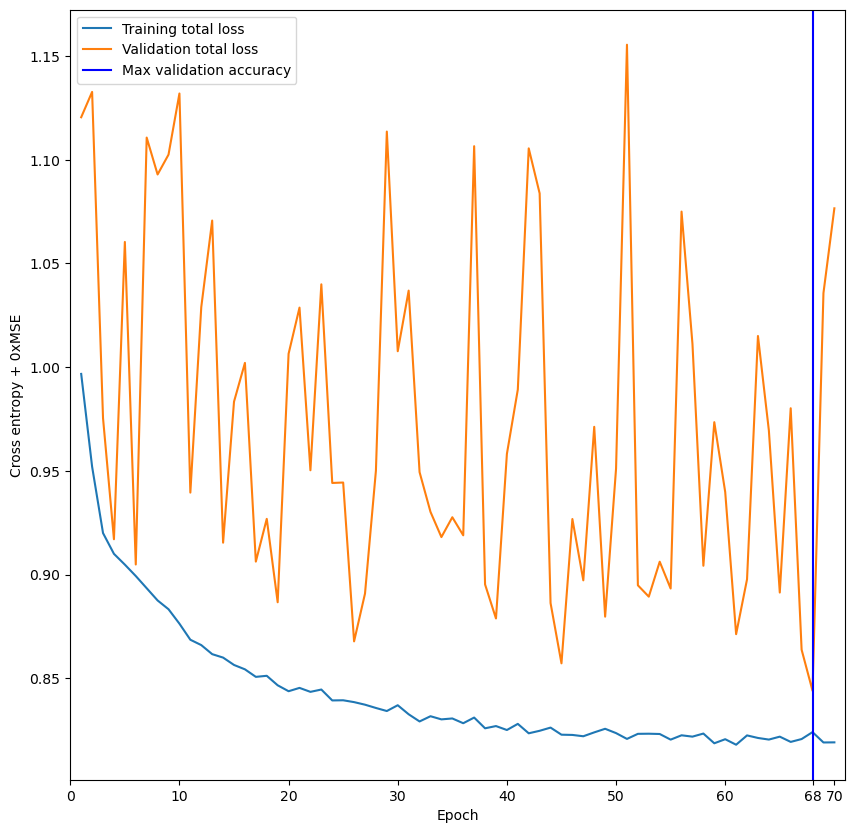

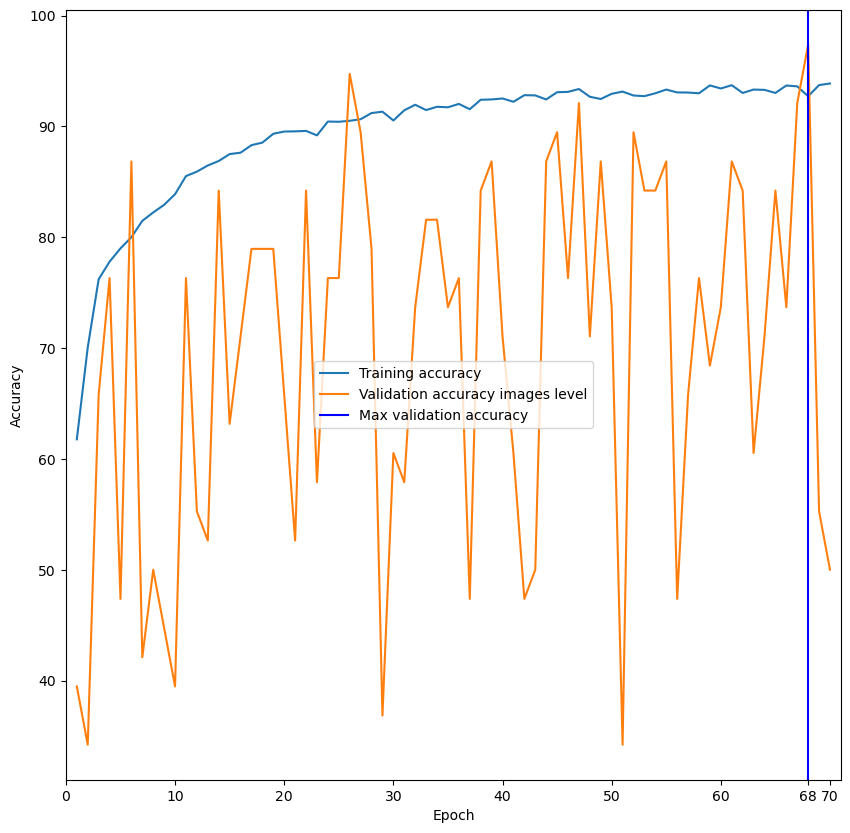

TRAIN set: 100%|█████████████████████████████████████████████████████████████████████| 261/261 [01:30<00:00,  2.89it/s]


TRAIN : Autoencoder Loss: 0.0291, Classifier Loss: 0.8389, Accuracy: 93.8697 in 261 input samples



VALIDATION set: 100%|██████████████████████████████████████████████████████████████████| 38/38 [00:12<00:00,  3.04it/s]


VALIDATION : Autoencoder Loss: 0.0279, Classifier Loss: 0.8440, Accuracy: 97.3684 in 38 input samples



TEST set: 100%|████████████████████████████████████████████████████████████████████████| 75/75 [00:24<00:00,  3.01it/s]

TEST : Autoencoder Loss: 0.0289, Classifier Loss: 0.8815, Accuracy: 86.6667 in 75 input samples



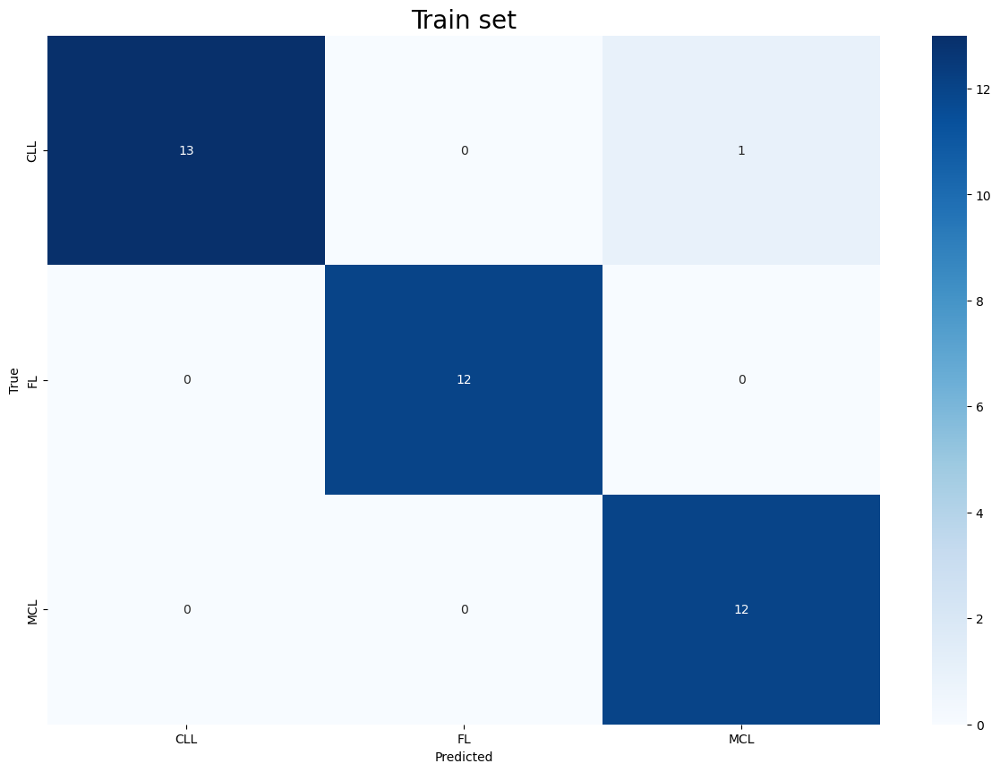

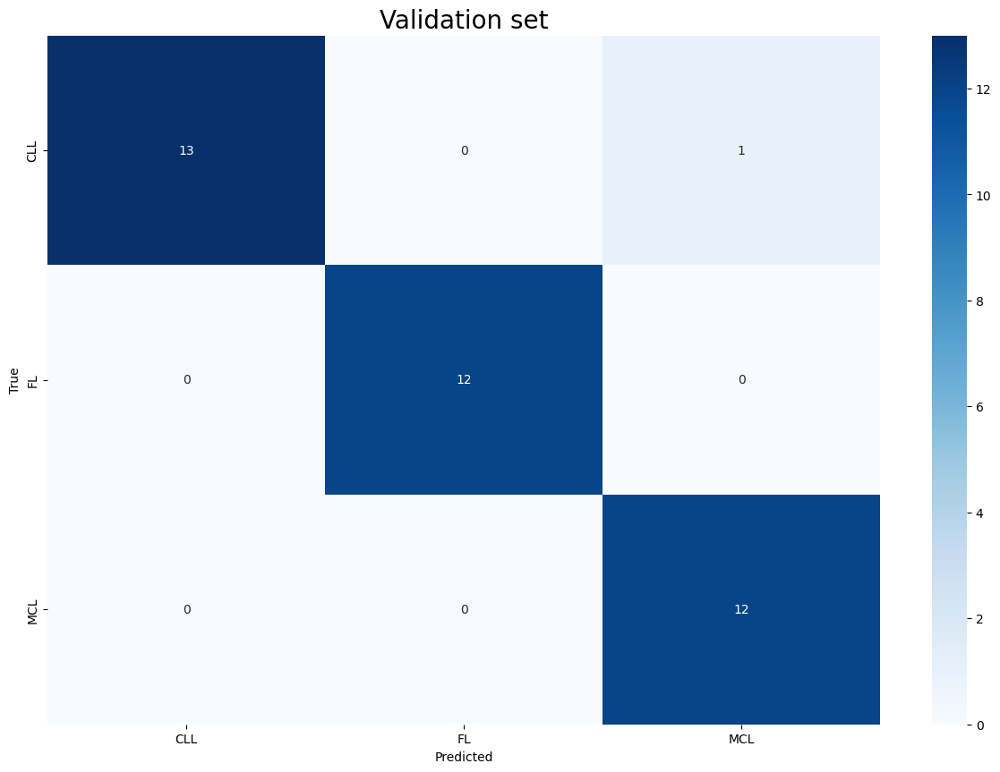

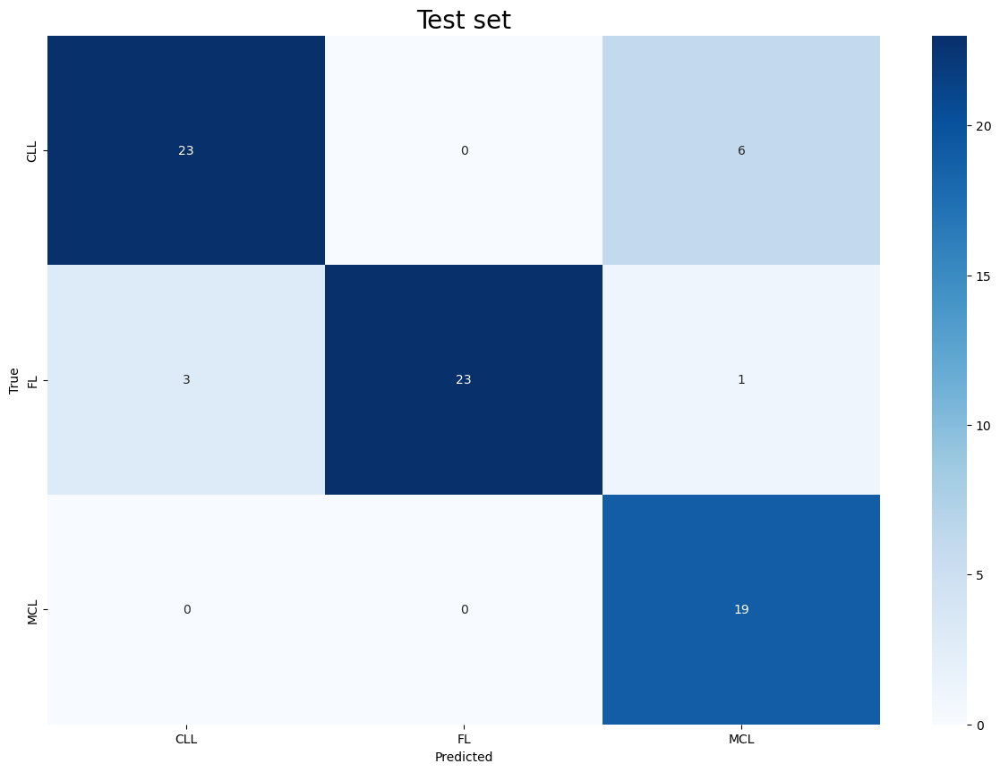

TRAIN set: 100%|█████████████████████████████████████████████████████████████████████| 261/261 [00:52<00:00,  5.02it/s]


TRAIN : Autoencoder Loss: 0.0291, Classifier Loss: 0.8389, Accuracy: 93.8697 in 261 input samples



VALIDATION set: 100%|██████████████████████████████████████████████████████████████████| 38/38 [00:07<00:00,  5.32it/s]


VALIDATION : Autoencoder Loss: 0.0279, Classifier Loss: 0.8440, Accuracy: 97.3684 in 38 input samples



TEST set: 100%|████████████████████████████████████████████████████████████████████████| 75/75 [00:14<00:00,  5.30it/s]

TEST : Autoencoder Loss: 0.0289, Classifier Loss: 0.8815, Accuracy: 86.6667 in 75 input samples



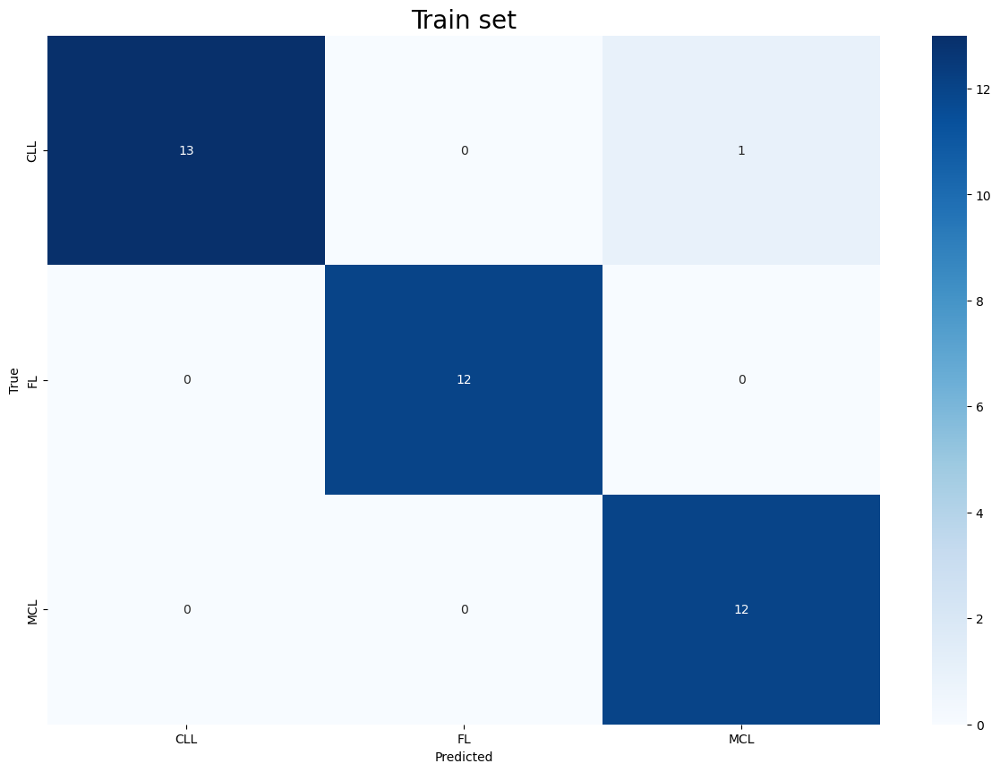

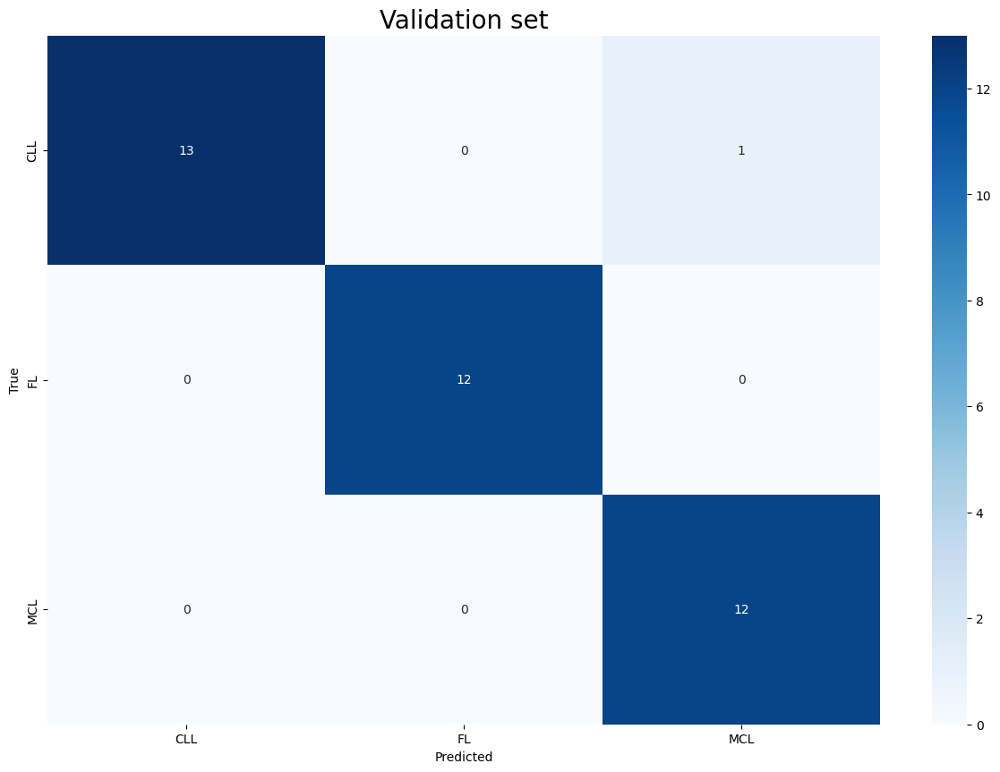

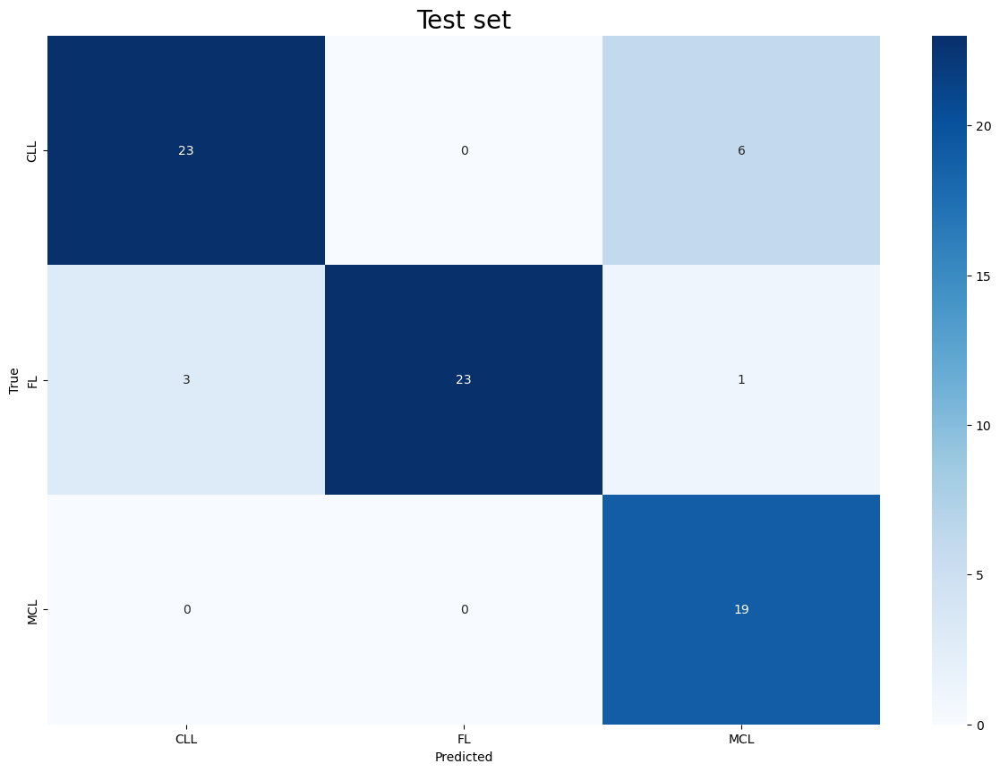

In [205]:
if (LOAD_MODEL): #the model trained without the decoder is avaible in the folder downloaded
    
    #load the model an the results
    autoencoder.load_state_dict(torch.load(os.path.join(models_dir,"0_best_ae.pt")))
    autoencoder.eval();
    
    mse_weight = 0 #the loaded model use a mse_weight = 50
    results = np.load(os.path.join(models_dir,"0_results.npy"),allow_pickle=True)
    
    #train
    train_ae = results[0][0] #mse
    train_c = results[0][1] #cross entropy
    train_acc = results[0][2] #accuracy patches level

    #validation
    val_ae = results[1][0] #mse
    val_c = results[1][1] #cross entropy
    val_acc = results[1][2] #accuracy images level

    #best epoch number
    best_epoch = results[2]
    
    #generating the batch indexes
    batchID = np.array([i+1 for i in range(len(train_ae))])
    
    ######AUTOENCODER LOSS#######
    plt.figure(figsize=(10,10))

    #plotting the losses
    plt.plot(batchID,train_ae,label = "Training loss autoencoder")
    plt.plot(batchID,val_ae, label = "Validation loss autoencoder")
    plt.xlabel("Epoch")
    plt.ylabel("MSE")

    #showing the position of the best values
    plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

    #adding the position of the best values in the x axis
    ticks = list(plt.xticks()[0]) 
    ticks.extend([best_epoch])

    #limit the plot x-values
    plt.xticks(ticks)

    plt.xlim(0,batchID.max()+1)

    plt.legend()

    #saving the figure
    if(SAVE_FIG):
        plt.savefig(str(mse_weight)+"_training-val_mse")
    plt.show()
    
    
    ######CLASSIFIER LOSS#######
    plt.figure(figsize=(10,10))

    #plotting the losses
    plt.plot(batchID,train_c,label = "Training loss classifier")
    plt.plot(batchID,val_c, label = "Validation loss classifier")
    plt.xlabel("Epoch")
    plt.ylabel("Cross entropy")

    #showing the position of the best values
    plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

    #adding the position of the best values in the x axis
    ticks = list(plt.xticks()[0]) 
    ticks.extend([best_epoch])
    plt.xticks(ticks)

    #limit the plot x-values
    plt.xlim(0,batchID.max()+1)

    plt.legend()

    #saving the figure
    if(SAVE_FIG):
        plt.savefig(str(mse_weight)+"_train-val_ce")
    plt.show()
    
    
    ######TOTAL LOSS#######
    plt.figure(figsize=(10,10))

    #plotting the losses
    plt.plot(batchID,train_c+mse_weight*np.ones(len(batchID))*train_ae,label = "Training total loss")
    plt.plot(batchID,val_c+mse_weight*np.ones(len(batchID))*val_ae, label = "Validation total loss")
    plt.xlabel("Epoch")
    plt.ylabel("Cross entropy + "+str(mse_weight)+"xMSE")

    #showing the position of the best values
    plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

    #adding the position of the best values in the x axis
    ticks = list(plt.xticks()[0]) 
    ticks.extend([best_epoch])
    plt.xticks(ticks)

    #limit the plot x-values
    plt.xlim(0,batchID.max()+1)

    plt.legend()

    #saving the figure
    if(SAVE_FIG):
        plt.savefig(str(mse_weight)+"_train-val_totalloss")
    plt.show()
    
    
    ######ACCURACY#######
    plt.figure(figsize=(10,10))

    #plotting the accuracy
    plt.plot(batchID,train_acc,label = "Training accuracy")
    plt.plot(batchID,val_acc, label = "Validation accuracy images level")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")

    #showing the position of the best values
    plt.axvline(x = best_epoch, color = 'b', label = "Max validation accuracy")

    #adding the position of the best values in the x axis
    ticks = list(plt.xticks()[0]) 
    ticks.extend([best_epoch])
    plt.xticks(ticks)

    #limit the plot x-values
    plt.xlim(0,batchID.max()+1)

    plt.legend()

    #saving the figure
    if(SAVE_FIG):
        plt.savefig(str(mse_weight)+"_train-val_accuracy")
    plt.show()
    
    ######TESTING#######
    _,_,_,real_train,pred_train = test(train_dataset,"TRAIN")
    _,_,_,real_val,pred_val = test(val_dataset,"VALIDATION")
    _,_,_,real_test,pred_test = test(test_dataset,"TEST");
    
    print_confusion_matrix_pandas(real_val,pred_val,"Train set",save_img = SAVE_FIG)
    print_confusion_matrix_pandas(real_val,pred_val,"Validation set",save_img = SAVE_FIG)
    print_confusion_matrix_pandas(real_test,pred_test,"Test set",save_img = SAVE_FIG);
    
    
    ######TESTING WITH WEIGHTED SUM IN CASE OF SAME COUNT#######
    _,_,_,real_val,pred_val = test_modified(train_dataset,"TRAIN");
    _,_,_,real_val,pred_val = test_modified(val_dataset,"VALIDATION");
    _,_,_,real_test,pred_test = test_modified(test_dataset,"TEST");
    
    print_confusion_matrix_pandas(real_val,pred_val,"Train set",save_img = False)
    print_confusion_matrix_pandas(real_val,pred_val,"Validation set",save_img = False)
    print_confusion_matrix_pandas(real_test,pred_test,"Test set",save_img = False);